## 1. Создание предсказательной модели и оценивание её качества.

Считаем данные из скачанной открытой гугл-папки

In [2]:
import os
import pandas as pd
path = r'/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new' 
data = {}

Data = []
Target = []

i = 0
for dir_entry in sorted(os.listdir(path)):
    dir_entry_path = os.path.join(path, dir_entry)
    if os.path.isfile(dir_entry_path):
        i += 1
        with open(dir_entry_path, 'r') as my_file:
            print(dir_entry_path.split("\\")[-1])
            try:
                df = pd.read_csv(my_file, delimiter=';')
                if df.shape[1] == 5:
                    Data.append(df)
                    Target.append(dir_entry_path.split("\\")[-1])
            except UnicodeDecodeError:
                print(dir_entry_path.split("\\")[-1])
                pass

for dir_entry in sorted(os.listdir(path)):
    dir_entry_path = os.path.join(path, dir_entry)
    if os.path.isfile(dir_entry_path):
        i += 1
        with open(dir_entry_path, 'r') as my_file:
            print(dir_entry_path.split("\\")[-1])
            try:
                df = pd.read_csv(my_file, delimiter=',')
                if df.shape[1] == 5:
                    Data.append(df)
                    Target.append(dir_entry_path.split("\\")[-1])
            except UnicodeDecodeError:
                print(dir_entry_path.split("\\")[-1])
                pass

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_0.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_1.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_10.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_100.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_101.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_102.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_103.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_104.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_105.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_106.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_107.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_108.csv
/Users/ni

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_79.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_8.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_80.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_81.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_82.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_83.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_84.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_85.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_86.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_87.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_88.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_89.csv
/Users/ninachel/D

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_54.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_55.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_56.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_57.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_58.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_59.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_6.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_60.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_61.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_62.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_63.csv
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_64.csv
/Users/ninachel/D

Переведём типы движений в числа

In [3]:
classes = {'тояни' : 0, 'месте' : 0, 'одьб' : 1, 'аг' : 1, 'ег' : 2, 'елоси' : 3, 'естн' : 4, 'одъ' : 4, 
           'втомо' : 5, 'ашин' : 5, 'метро' : 6, 'лектро' : 7, 'амок' : 8}

answers = {'стояние' : 0, 'ходьба' : 1, 'бег' : 2, 'велосипед' : 3, 'лестница' : 4, 
           'автомобиль' : 5, 'метро' : 6, 'электросамокат' : 7, 'самокат' : 8}

# стояние, ходьба, велосипед, лестница, бег, подъем, подъём, автомобиль, электросамокат, машина, метро

In [4]:
def get_action(name):
    for act in classes:
        if name.lower().find(act) != -1:
            return classes[act]
    return -1

Обработаем данные и извлечём признаки для создания модели

Populating the interactive namespace from numpy and matplotlib
/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_0.csv


/opt/anaconda3/lib/python3.8/site-packages/IPython/core/magics/pylab.py:159: UserWarning: pylab import has clobbered these variables: ['plt']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


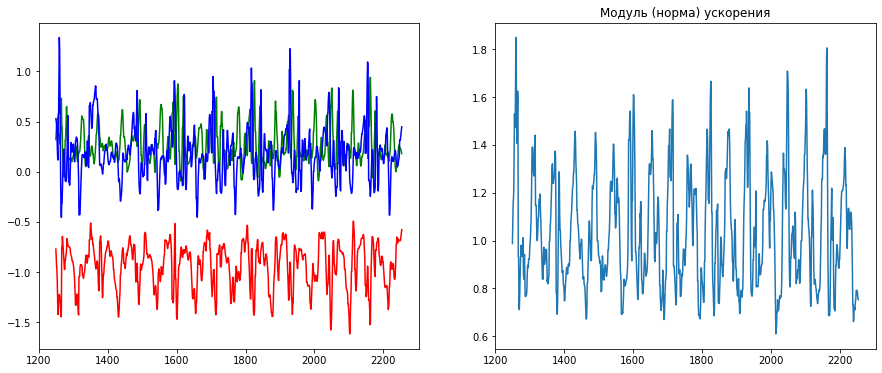

 АМПЛИТУДА: 1.2409331302405158

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_1.csv


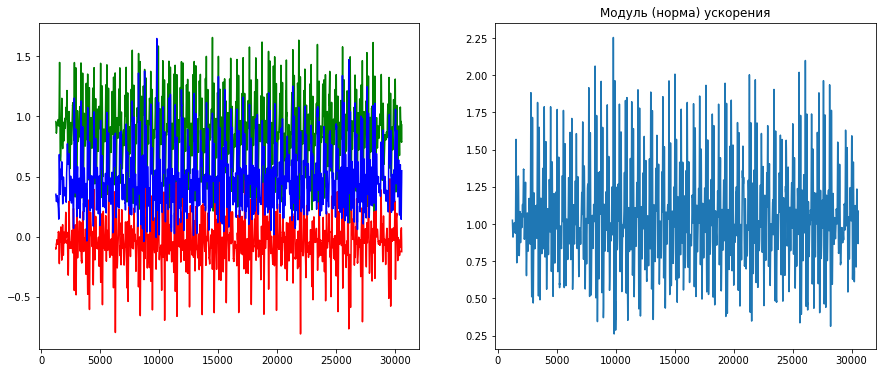

 АМПЛИТУДА: 1.9935598883036225

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_10.csv


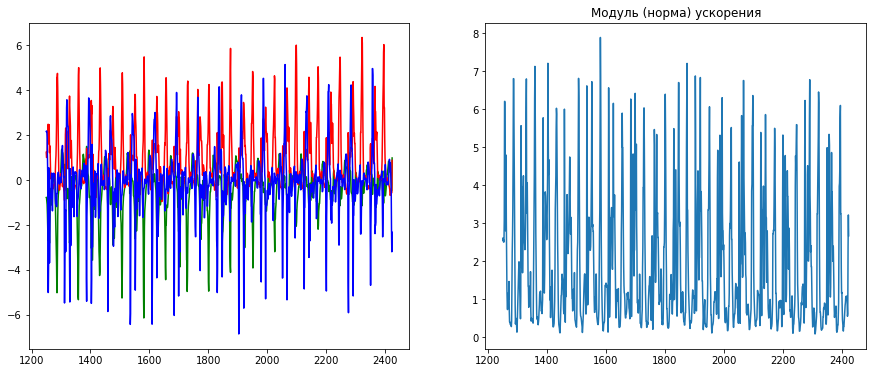

 АМПЛИТУДА: 7.802304392990605

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_100.csv


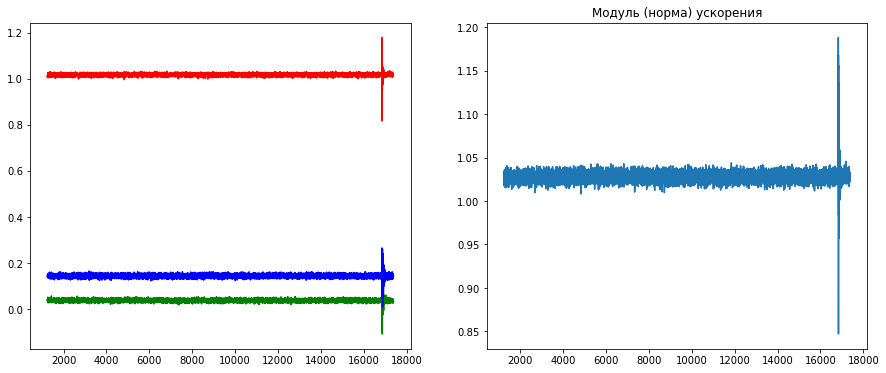

 АМПЛИТУДА: 0.34113272676839523

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_101.csv


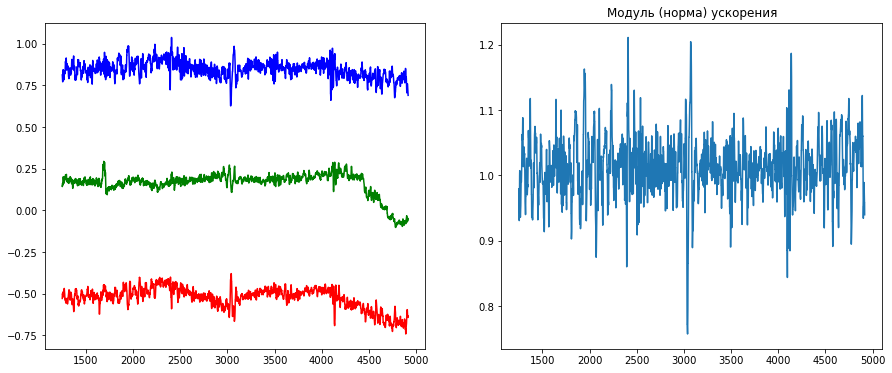

 АМПЛИТУДА: 0.4539765748076483

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_102.csv


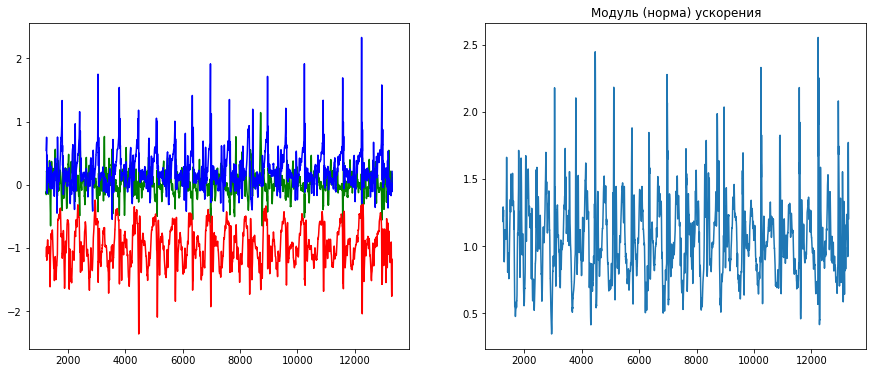

 АМПЛИТУДА: 2.2110203625988167

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_103.csv


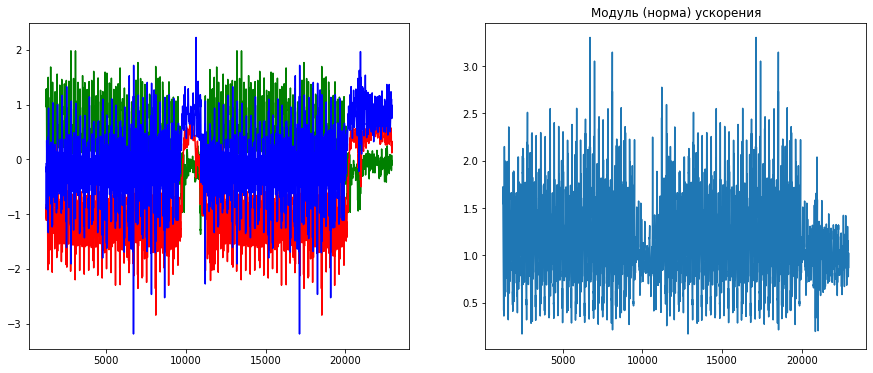

 АМПЛИТУДА: 3.1345378975461413

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_104.csv


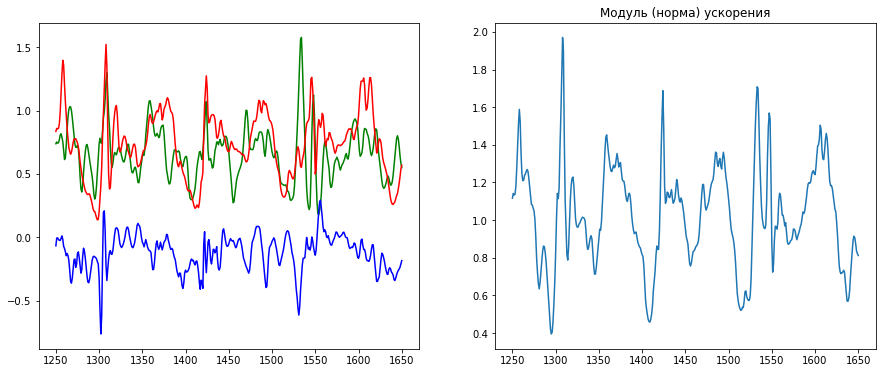

 АМПЛИТУДА: 1.5750179236901383

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_105.csv


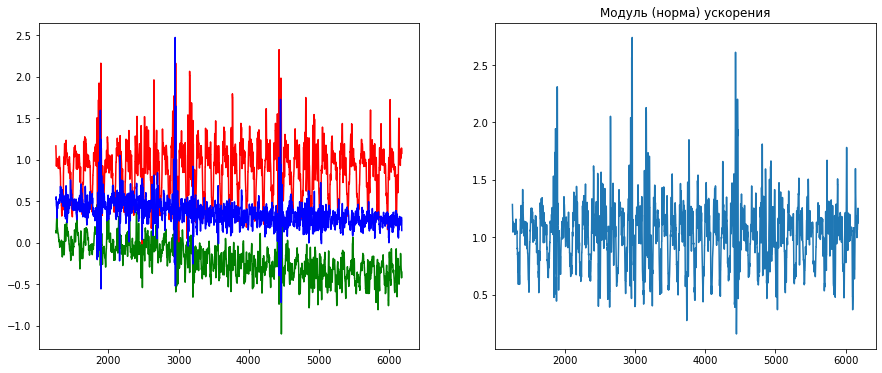

 АМПЛИТУДА: 2.5835429119223496

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_106.csv


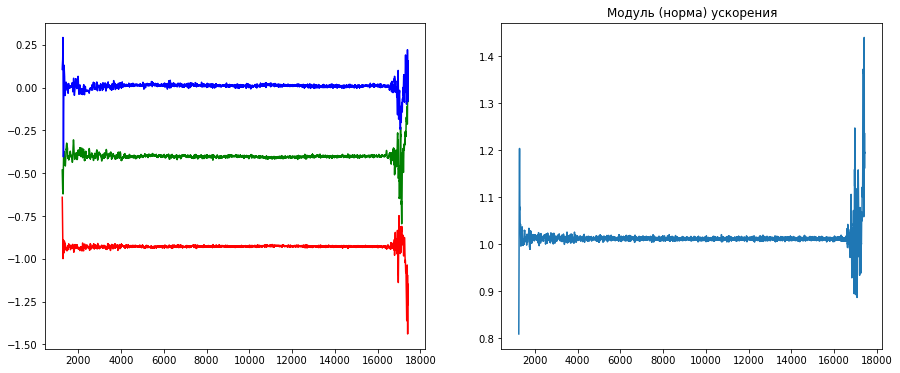

 АМПЛИТУДА: 0.6312015938792386

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_107.csv


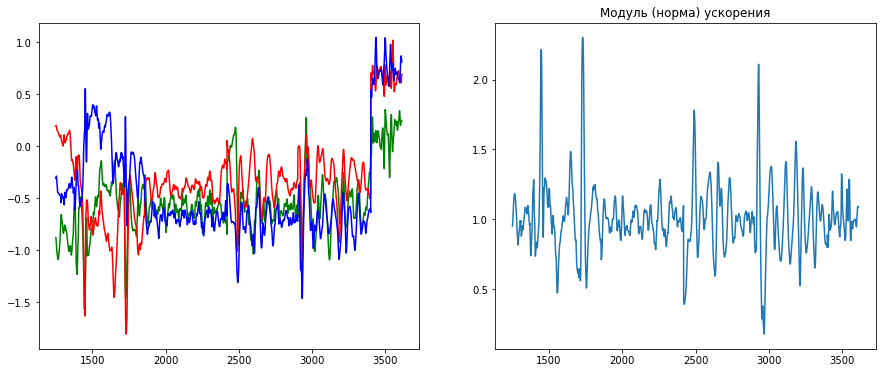

 АМПЛИТУДА: 2.124336238883378

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_108.csv


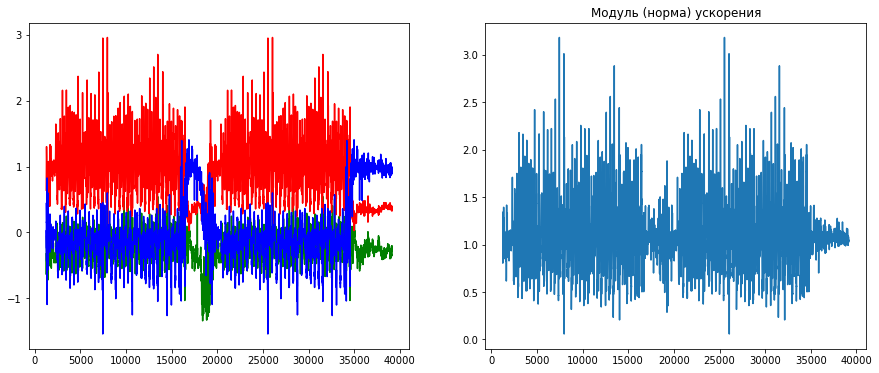

 АМПЛИТУДА: 3.1243961620554765

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_109.csv


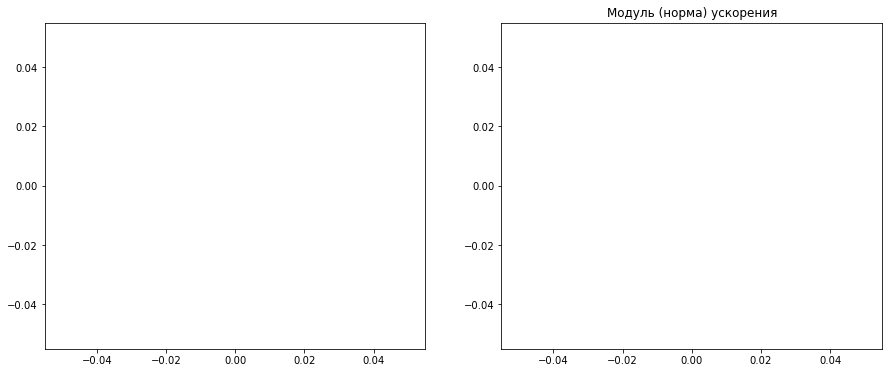

 АМПЛИТУДА: nan

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_11.csv


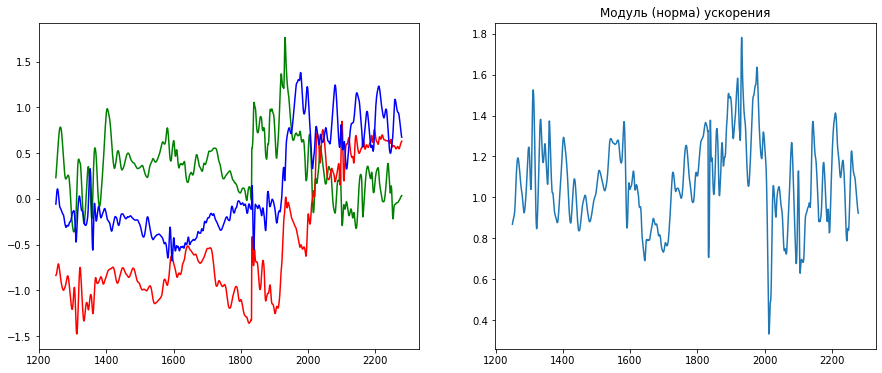

 АМПЛИТУДА: 1.4499291676896982

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_110.csv


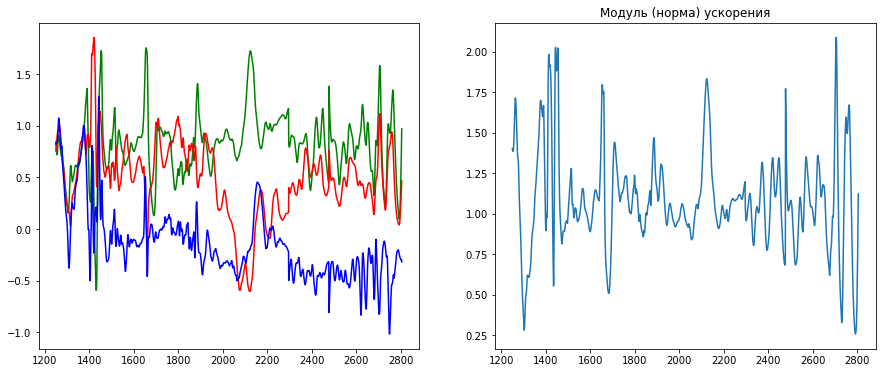

 АМПЛИТУДА: 1.8330376632404348

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_111.csv


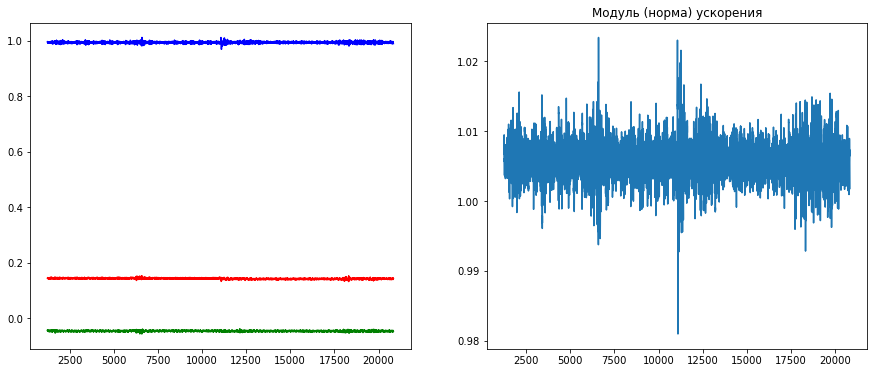

 АМПЛИТУДА: 0.042436878839561376

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_112.csv


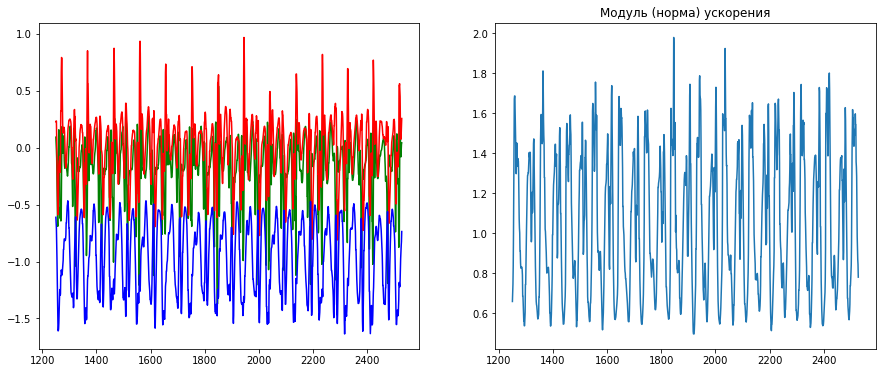

 АМПЛИТУДА: 1.4825475120699383

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_113.csv


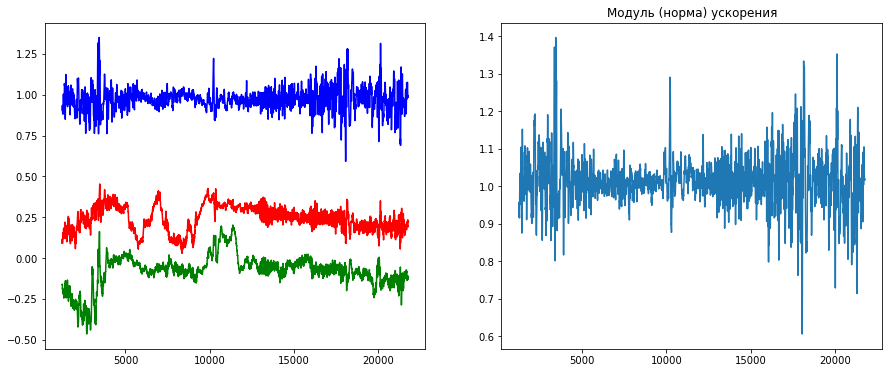

 АМПЛИТУДА: 0.7902169184700258

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_114.csv


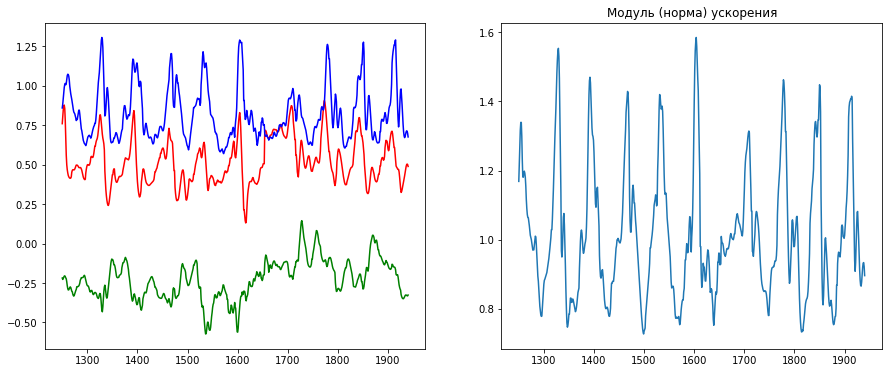

 АМПЛИТУДА: 0.8574945808044203

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_115.csv


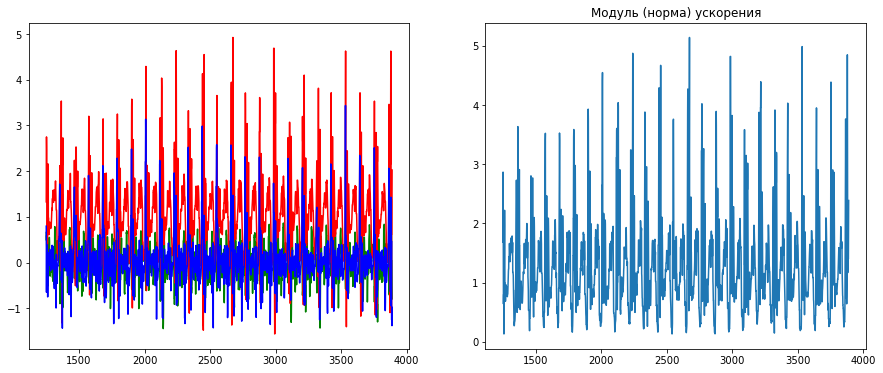

 АМПЛИТУДА: 5.0103722896175285

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_116.csv


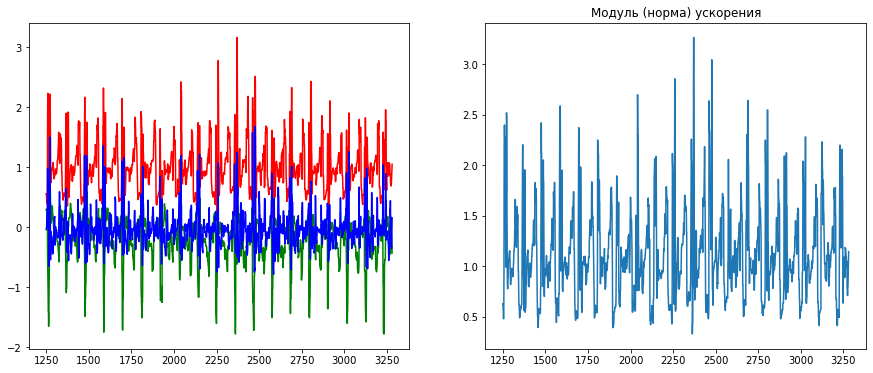

 АМПЛИТУДА: 2.933115416840867

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_117.csv


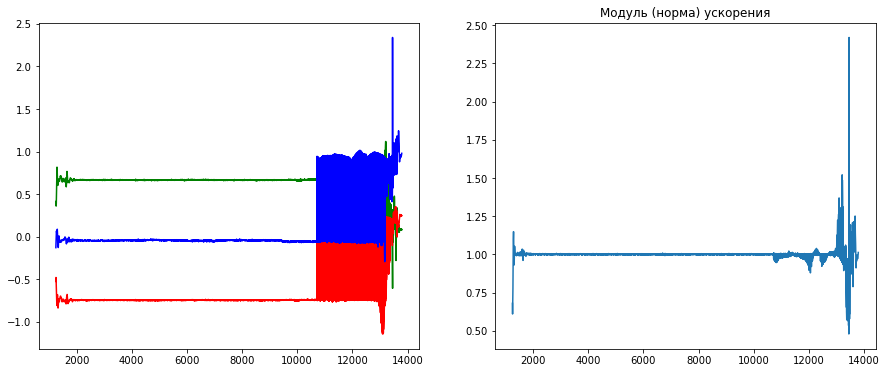

 АМПЛИТУДА: 1.938560304416

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_118.csv


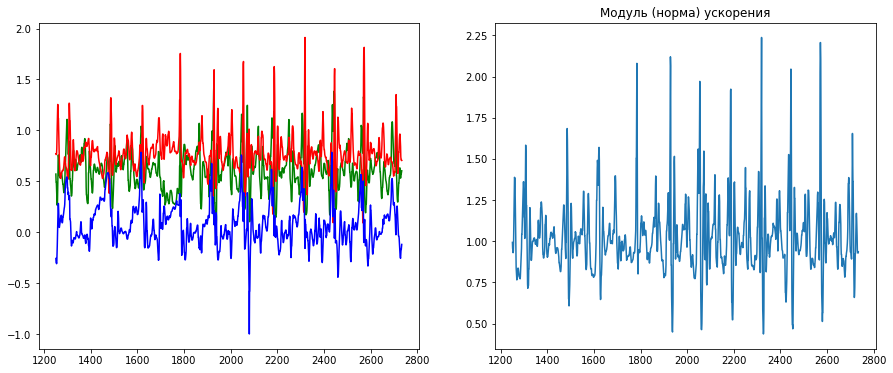

 АМПЛИТУДА: 1.8007366176688933

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_119.csv


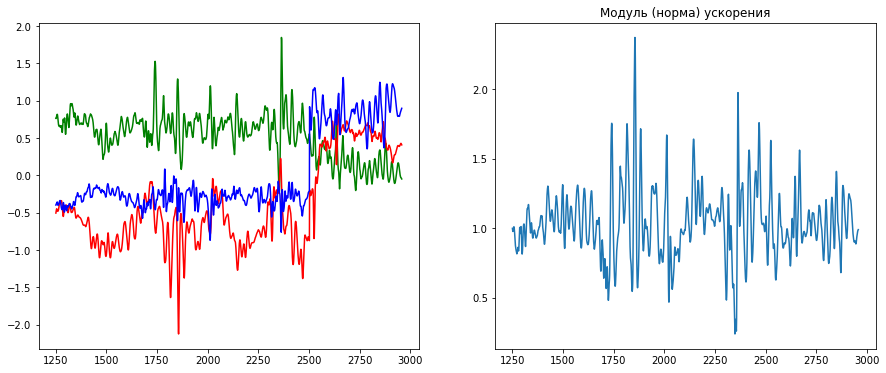

 АМПЛИТУДА: 2.1336461804594

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_12.csv


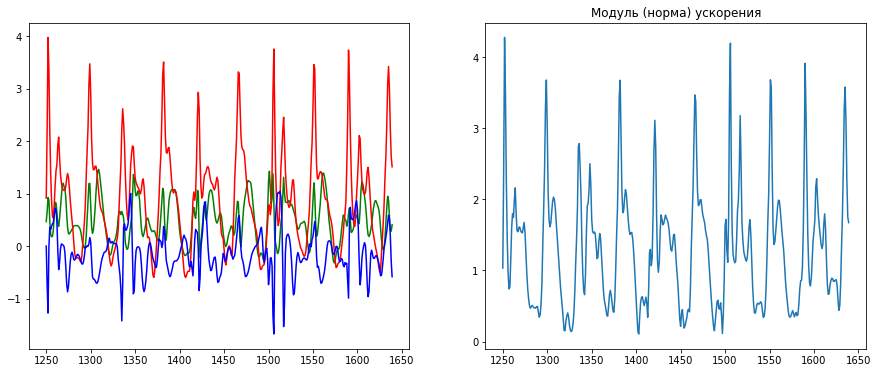

 АМПЛИТУДА: 4.167746272622168

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_120.csv


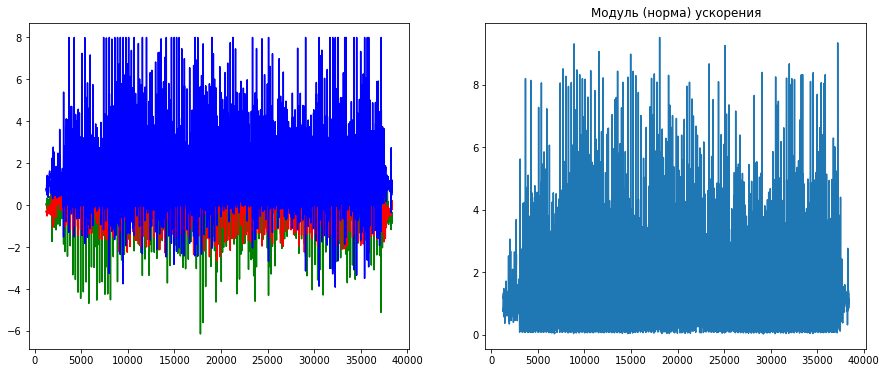

 АМПЛИТУДА: 9.491298391484909

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_121.csv


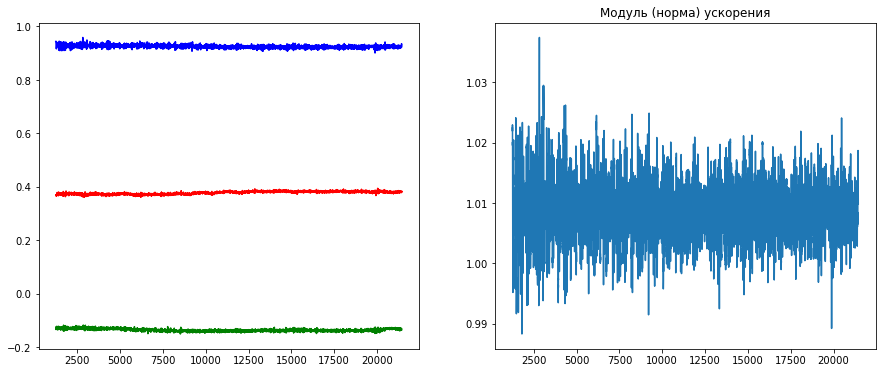

 АМПЛИТУДА: 0.04905596110186827

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_122.csv


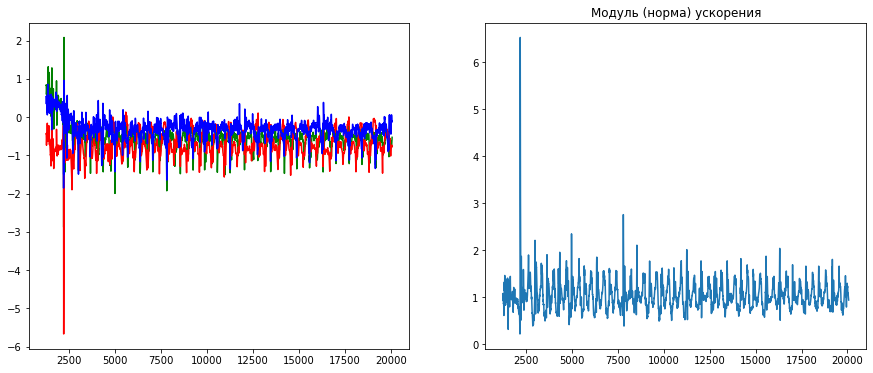

 АМПЛИТУДА: 6.307166487621298

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_123.csv


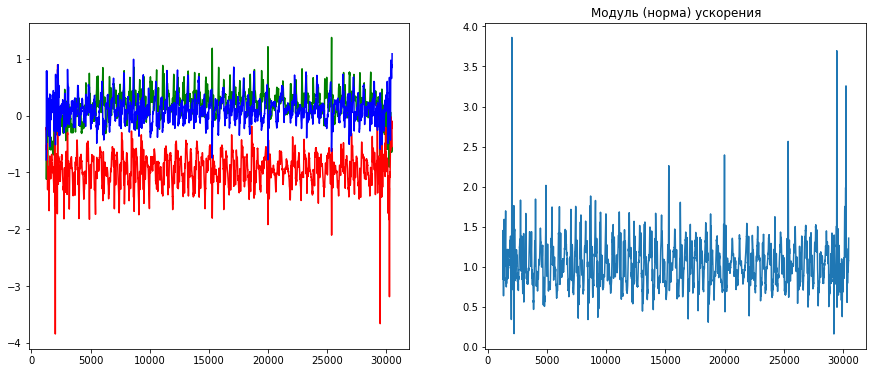

 АМПЛИТУДА: 3.7050364626718366

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_124.csv


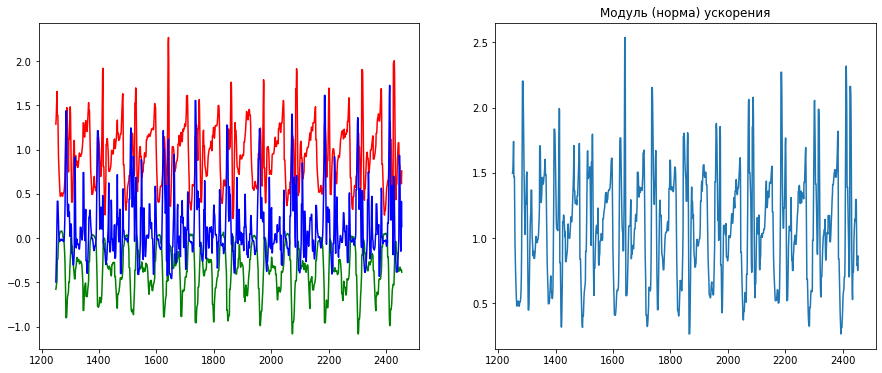

 АМПЛИТУДА: 2.2716957817171166

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_125.csv


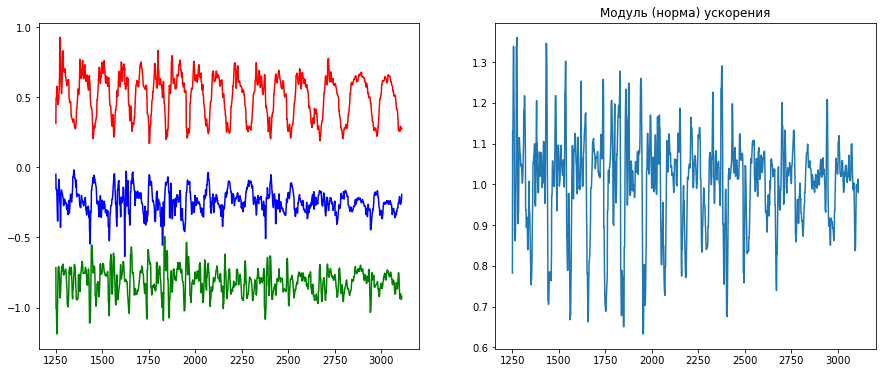

 АМПЛИТУДА: 0.7275186565098007

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_126.csv


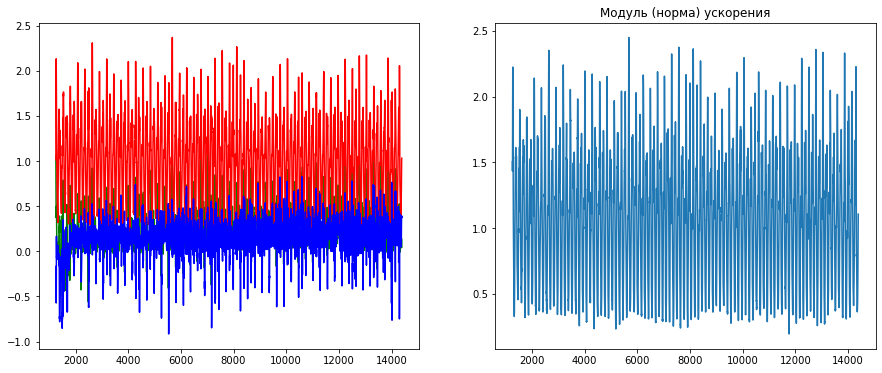

 АМПЛИТУДА: 2.2541200835418818

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_127.csv


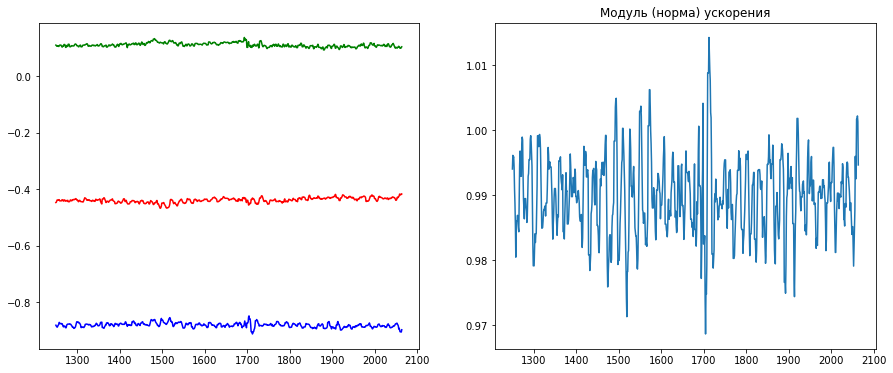

 АМПЛИТУДА: 0.045646484691718836

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_128.csv


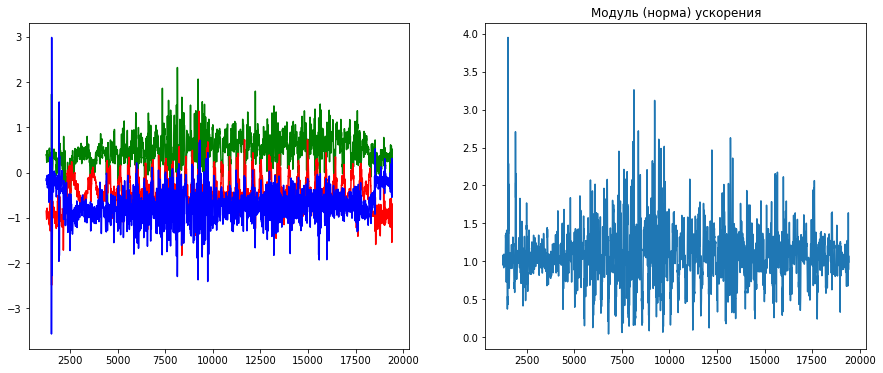

 АМПЛИТУДА: 3.9123474420824778

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_129.csv


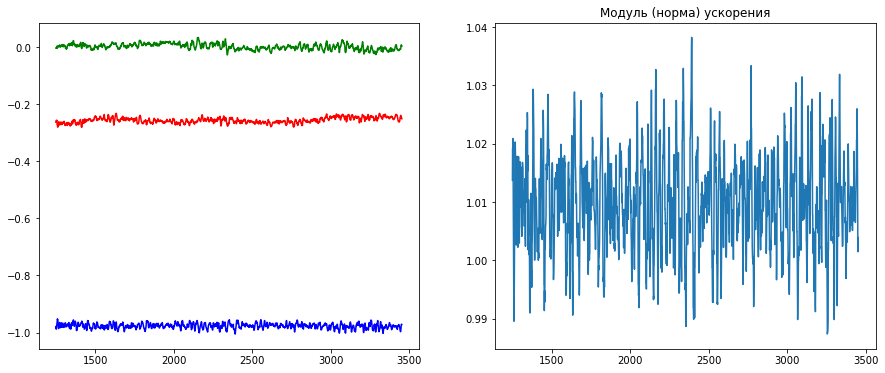

 АМПЛИТУДА: 0.05083922219291448

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_13.csv


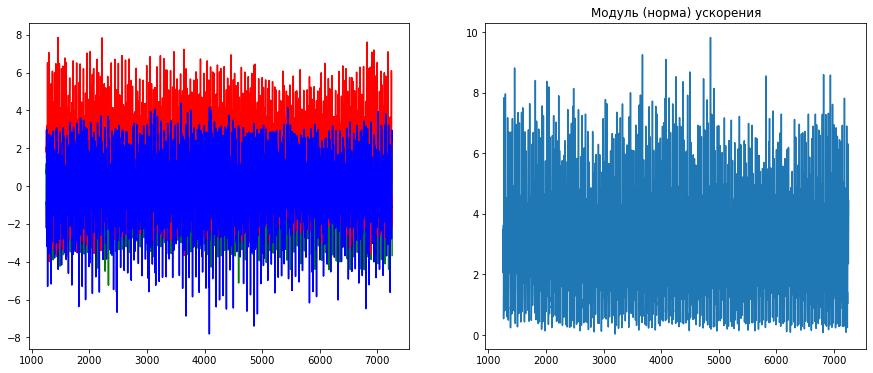

 АМПЛИТУДА: 9.793314652916319

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_130.csv


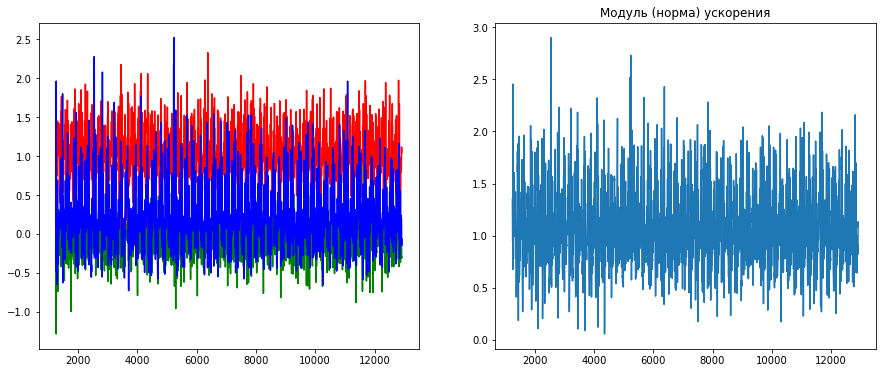

 АМПЛИТУДА: 2.84471874204167

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_131.csv


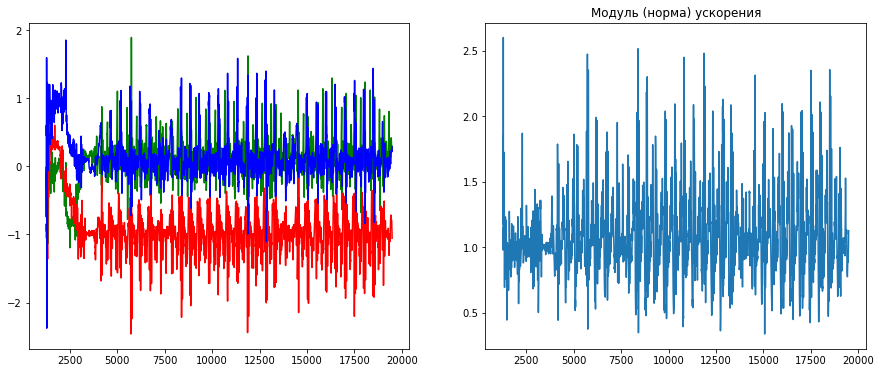

 АМПЛИТУДА: 2.261836569523423

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_132.csv


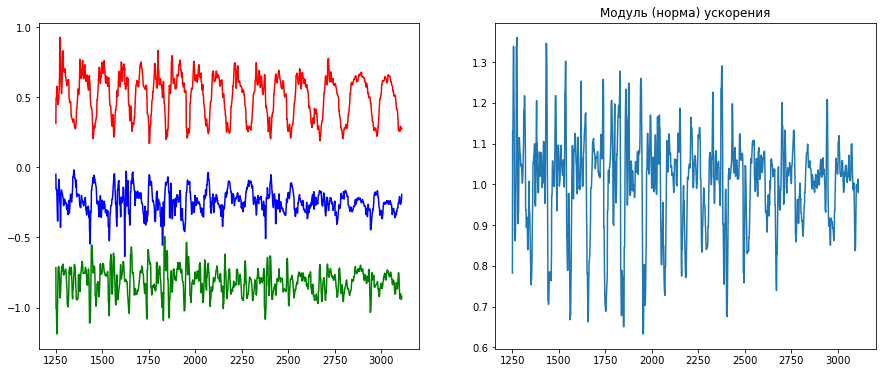

 АМПЛИТУДА: 0.7275186565098007

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_133.csv


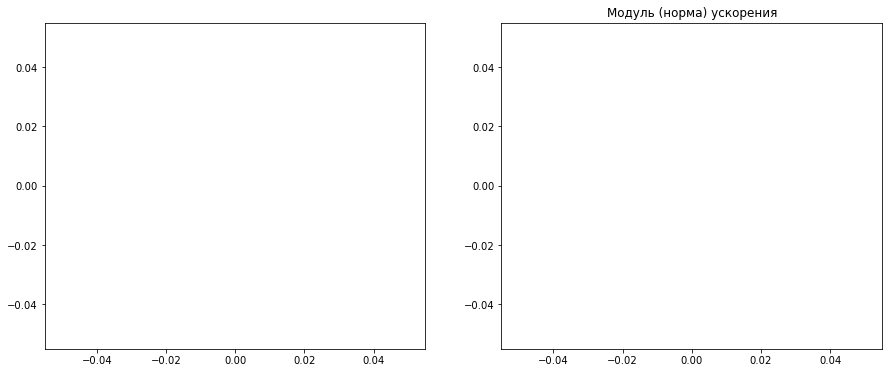

 АМПЛИТУДА: nan

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_134.csv


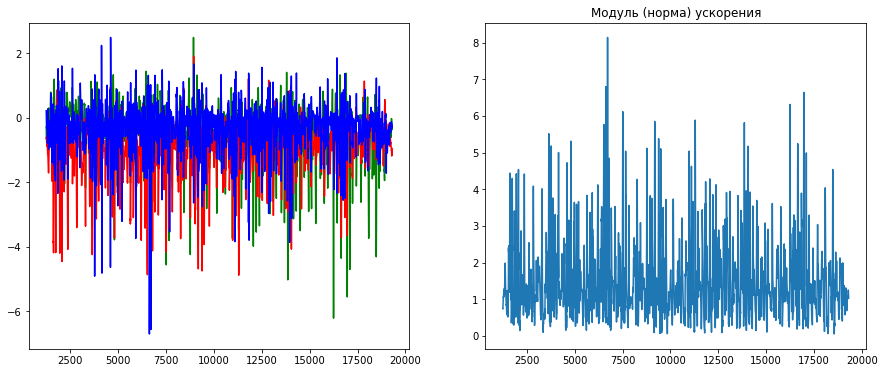

 АМПЛИТУДА: 8.086314669791548

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_135.csv


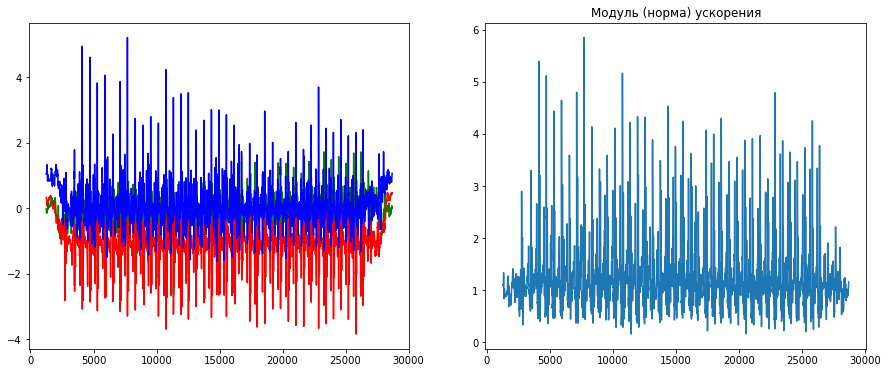

 АМПЛИТУДА: 5.687705532588813

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_136.csv


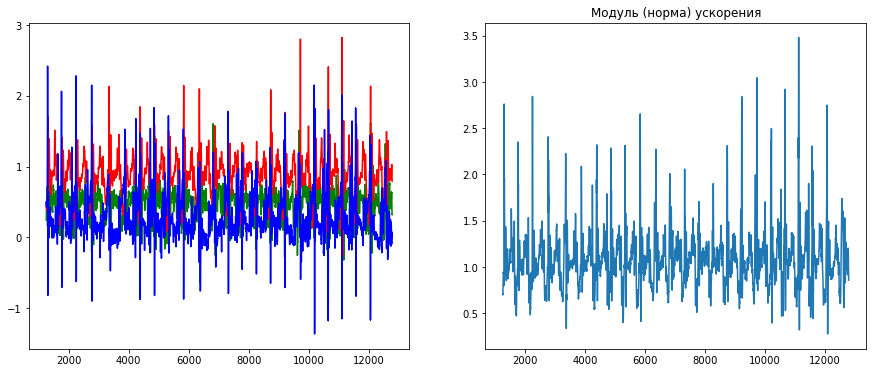

 АМПЛИТУДА: 3.206988566855495

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_137.csv


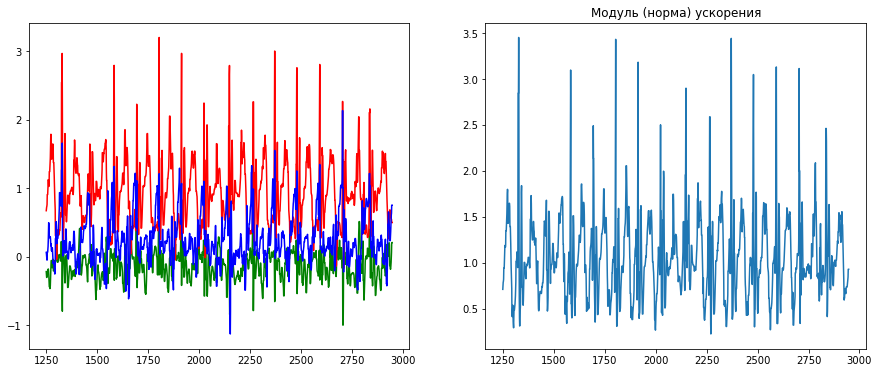

 АМПЛИТУДА: 3.228322334766254

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_138.csv


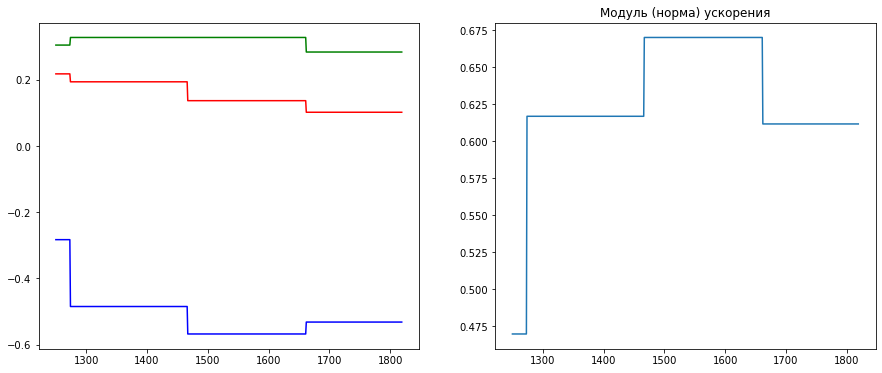

 АМПЛИТУДА: 0.20033626632139562

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_139.csv


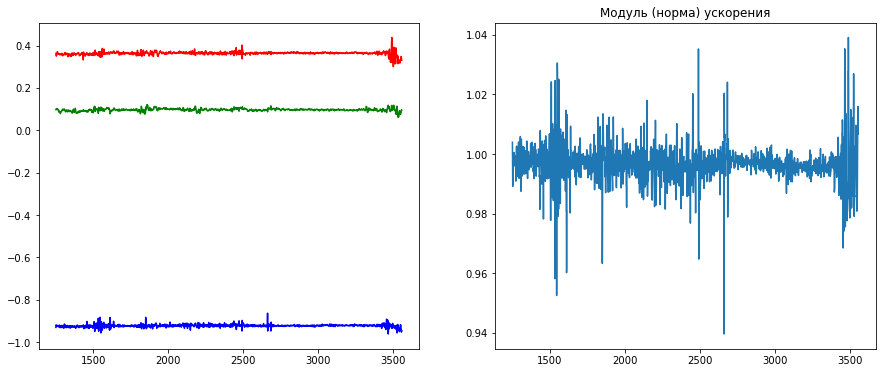

 АМПЛИТУДА: 0.09946198244797089

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_14.csv


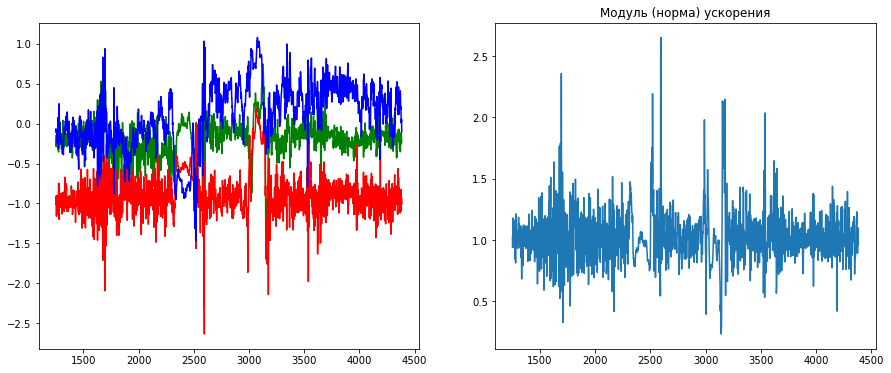

 АМПЛИТУДА: 2.4185341114208763

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_140.csv


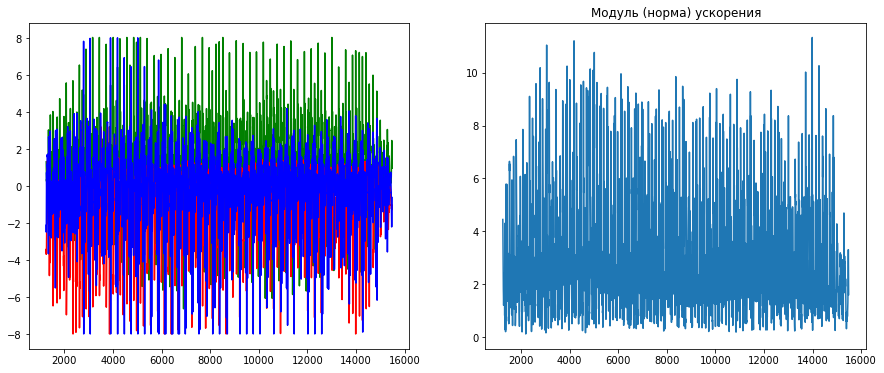

 АМПЛИТУДА: 11.21085698475714

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_141.csv


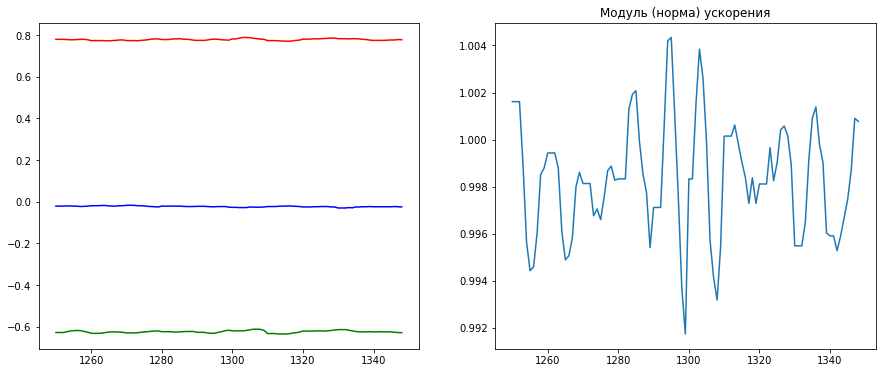

 АМПЛИТУДА: 0.012603227910627068

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_142.csv


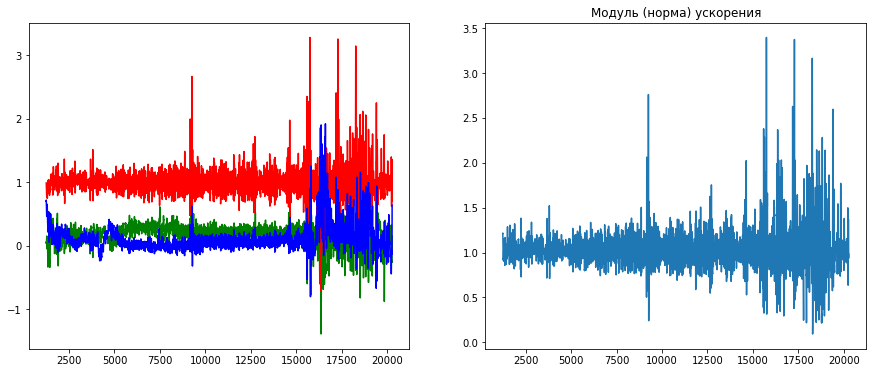

 АМПЛИТУДА: 3.304242898758394

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_143.csv


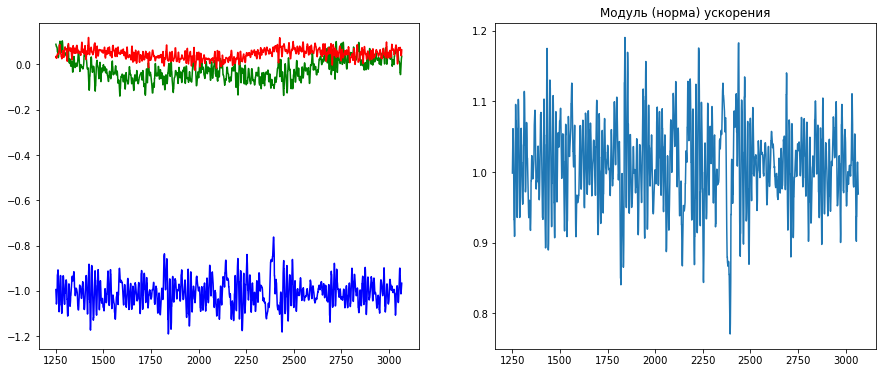

 АМПЛИТУДА: 0.4194272222654043

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_144.csv


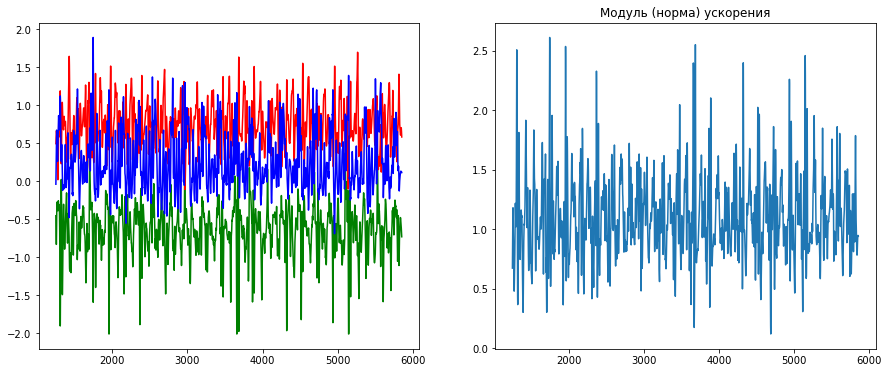

 АМПЛИТУДА: 2.493435844215357

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_145.csv


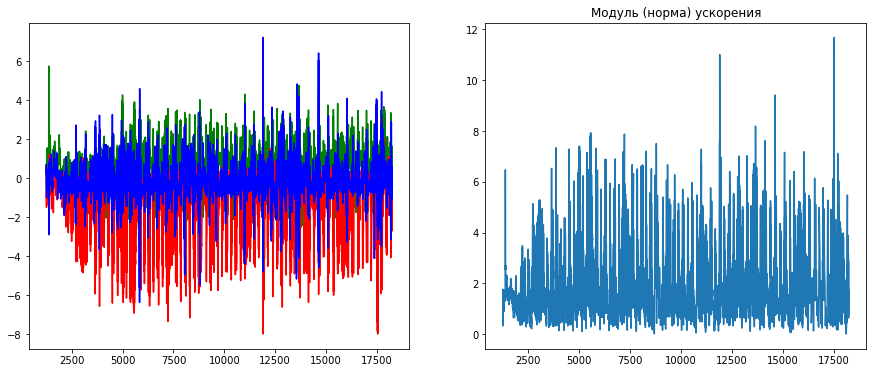

 АМПЛИТУДА: 11.667108550417067

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_15.csv


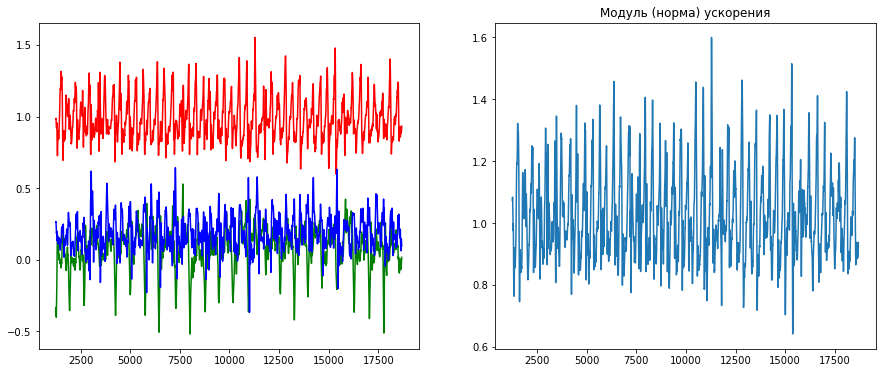

 АМПЛИТУДА: 0.9585710148889119

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_16.csv


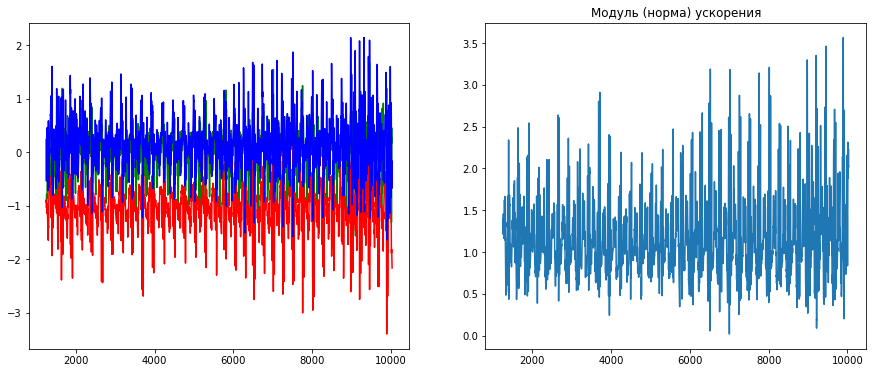

 АМПЛИТУДА: 3.546236822015291

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_17.csv


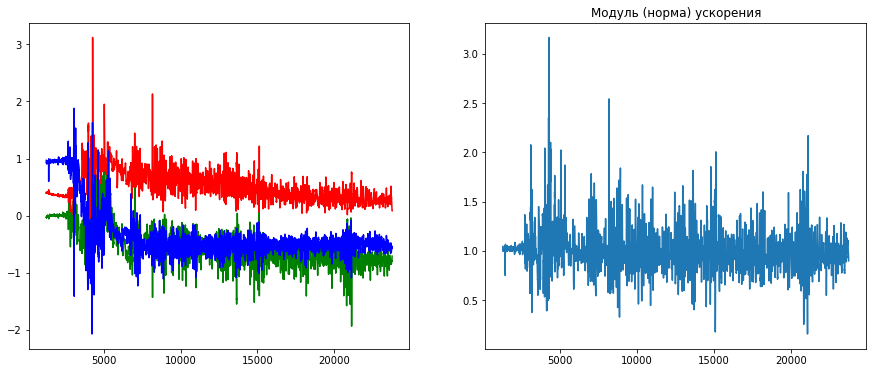

 АМПЛИТУДА: 3.0087221132495734

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_18.csv


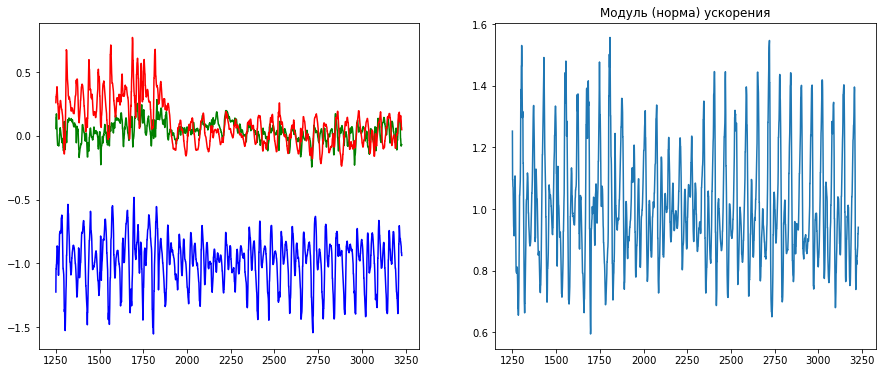

 АМПЛИТУДА: 0.9619686721188492

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_19.csv


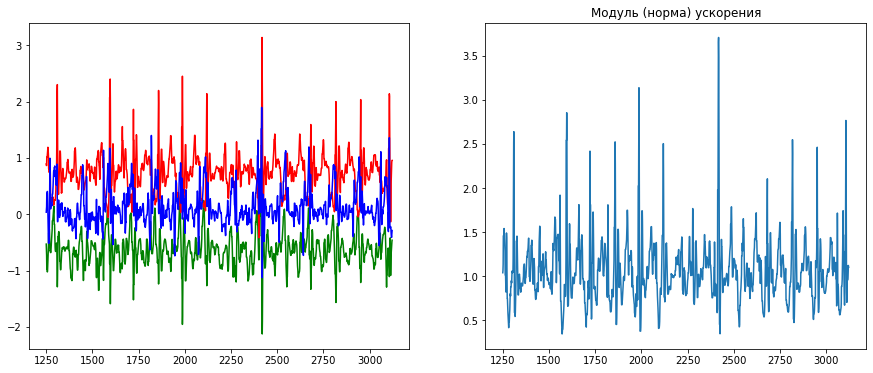

 АМПЛИТУДА: 3.3624614701244164

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_2.csv


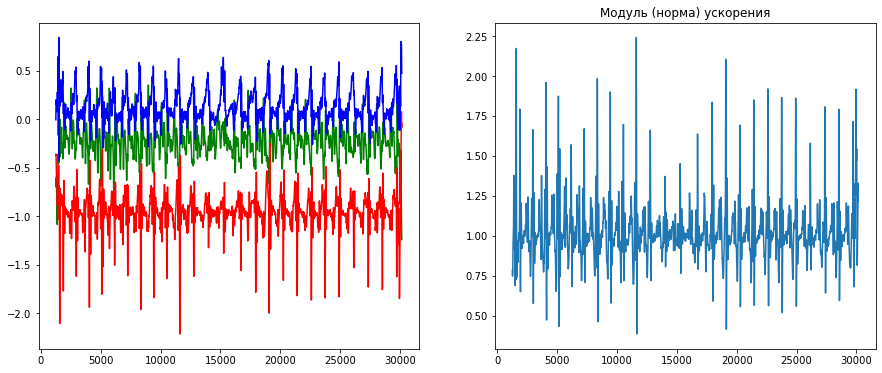

 АМПЛИТУДА: 1.8548524291039876

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_20.csv


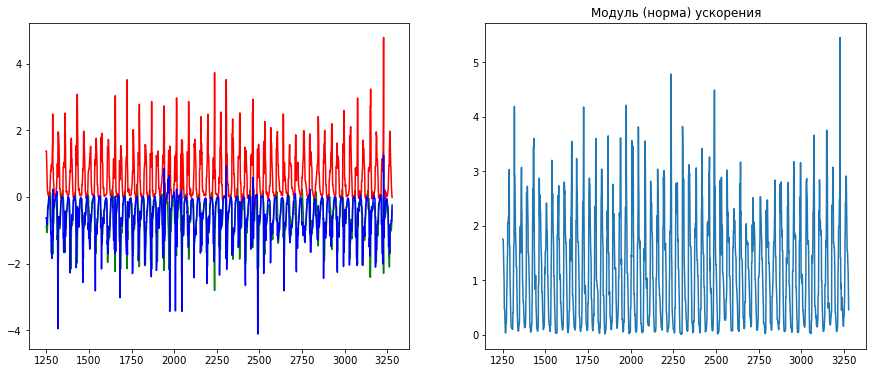

 АМПЛИТУДА: 5.444958679602382

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_21.csv


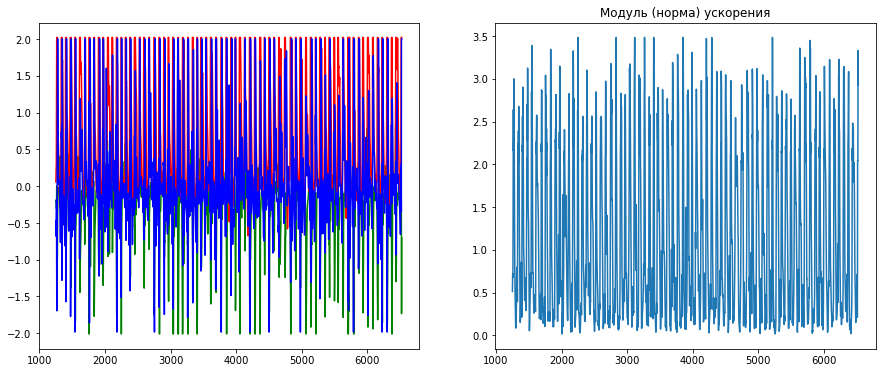

 АМПЛИТУДА: 3.468369477393101

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_22.csv


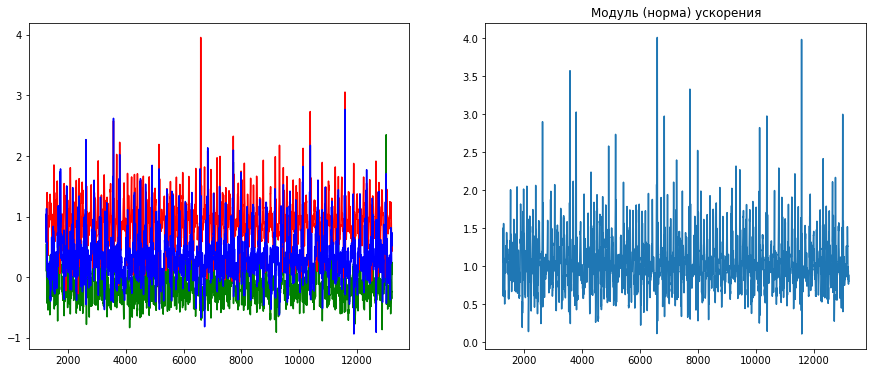

 АМПЛИТУДА: 3.9016035408785545

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_23.csv


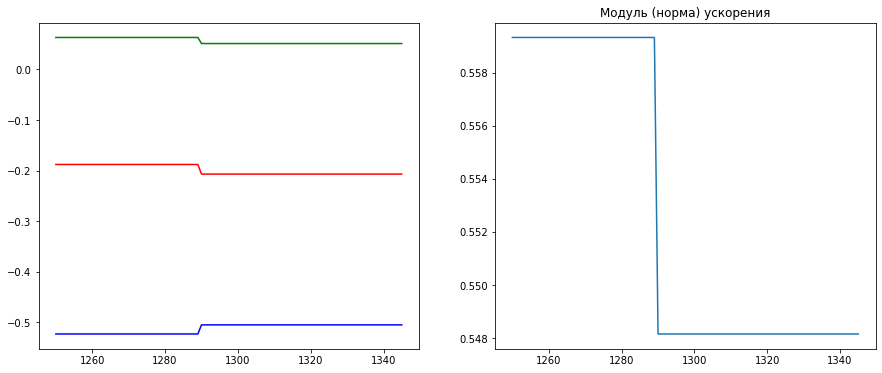

 АМПЛИТУДА: 0.011166805133891233

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_24.csv


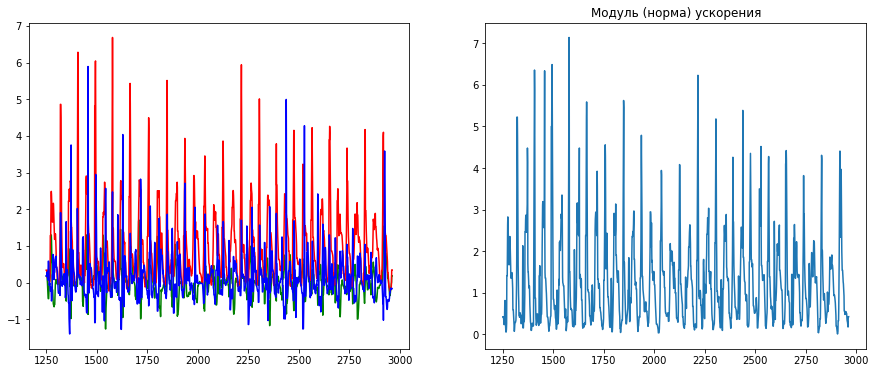

 АМПЛИТУДА: 7.128479662827425

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_25.csv


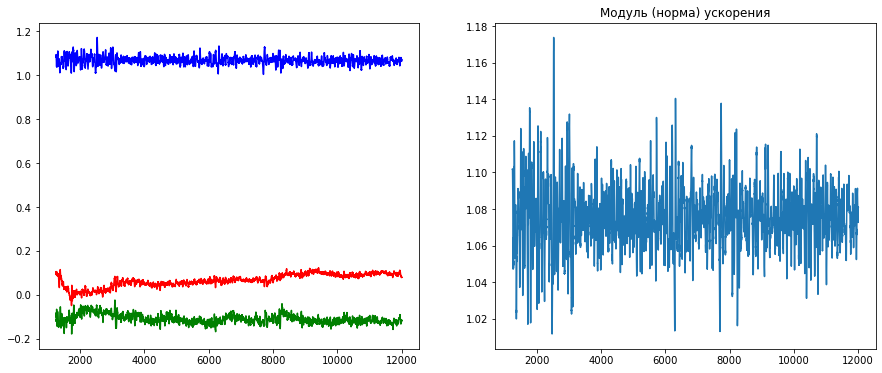

 АМПЛИТУДА: 0.1623116441104504

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_26.csv


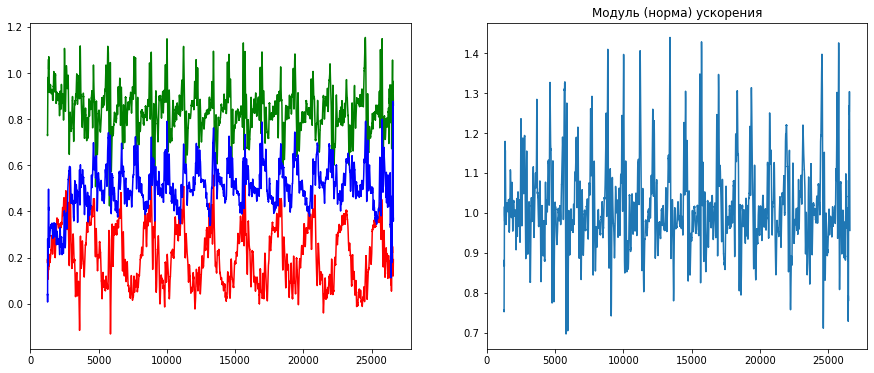

 АМПЛИТУДА: 0.741920211510277

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_27.csv


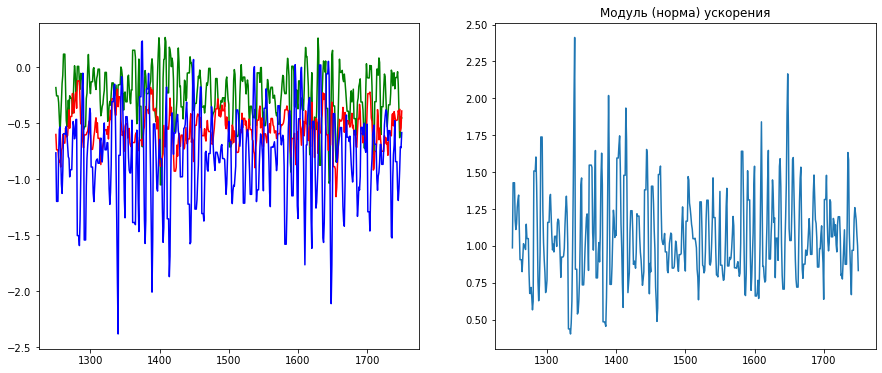

 АМПЛИТУДА: 2.010031339155569

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_28.csv


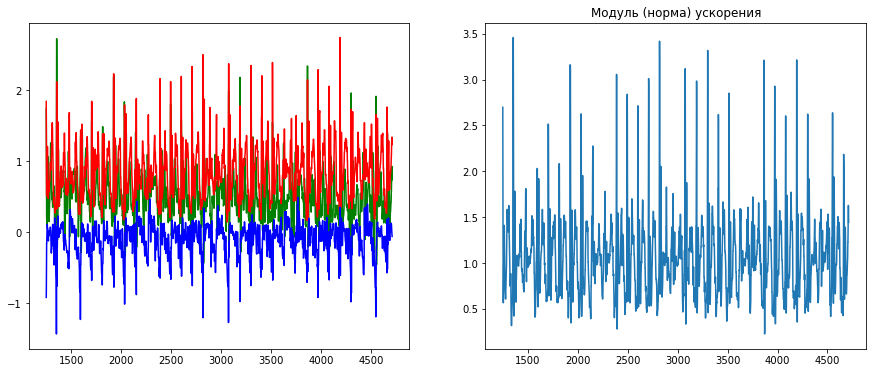

 АМПЛИТУДА: 3.2323211416069624

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_29.csv


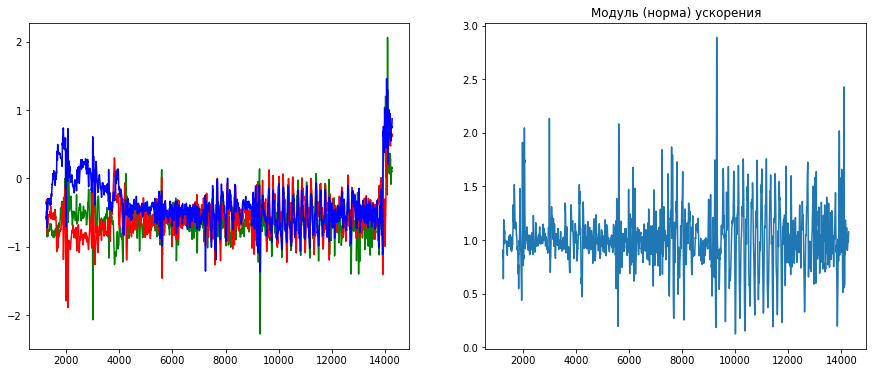

 АМПЛИТУДА: 2.76747032033991

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_3.csv


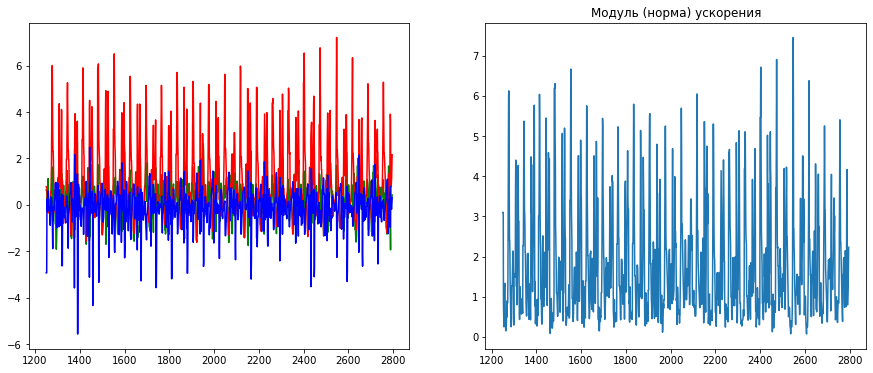

 АМПЛИТУДА: 7.376276708180853

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_30.csv


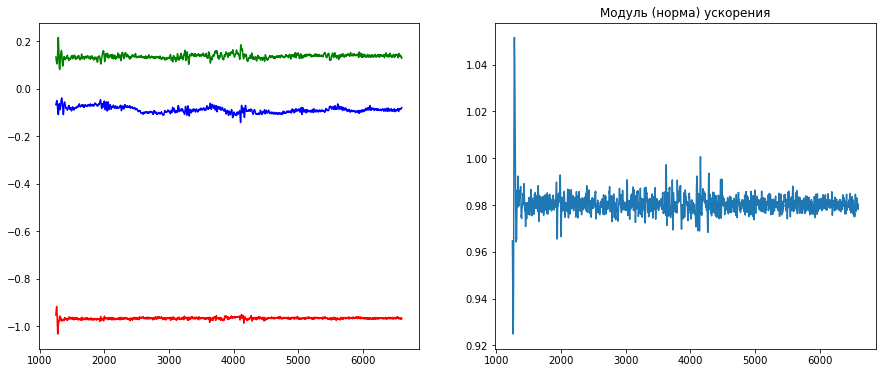

 АМПЛИТУДА: 0.1267000078041125

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_31.csv


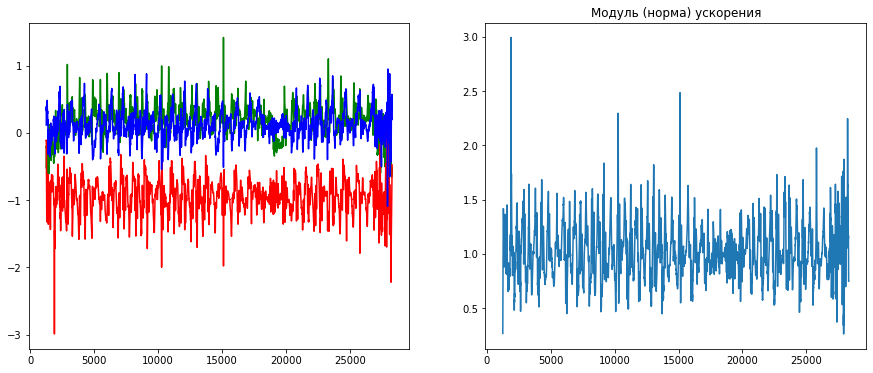

 АМПЛИТУДА: 2.731441542408507

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_32.csv


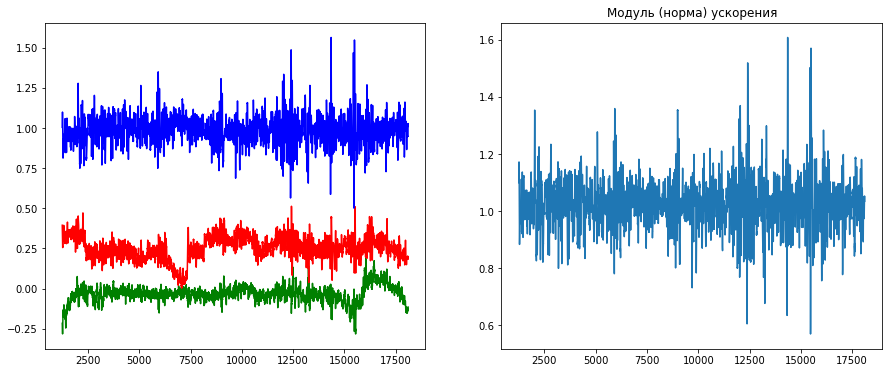

 АМПЛИТУДА: 1.037319895576775

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_33.csv


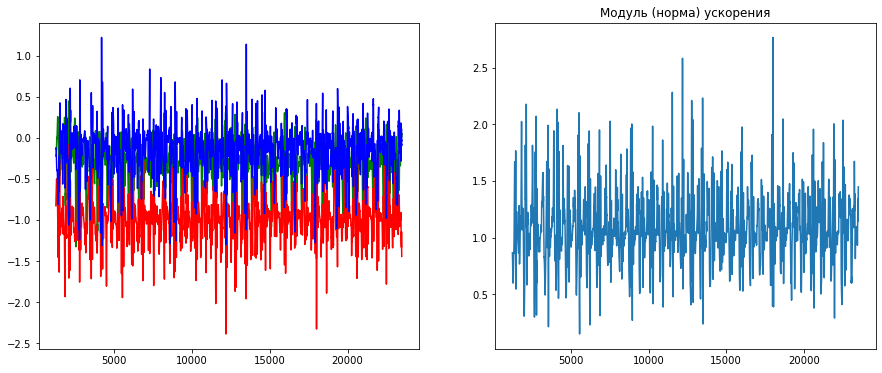

 АМПЛИТУДА: 2.619205131477962

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_34.csv


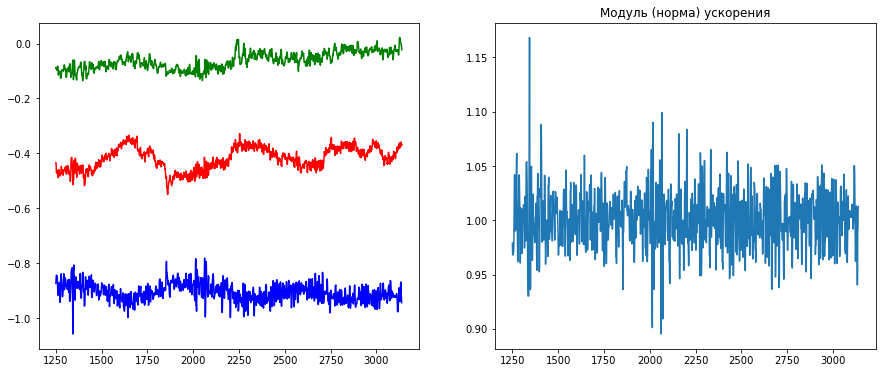

 АМПЛИТУДА: 0.27297256562029415

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_35.csv


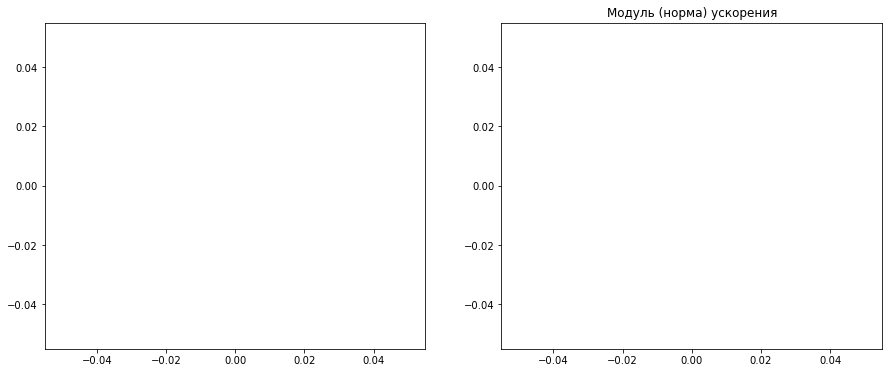

 АМПЛИТУДА: nan

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_36.csv


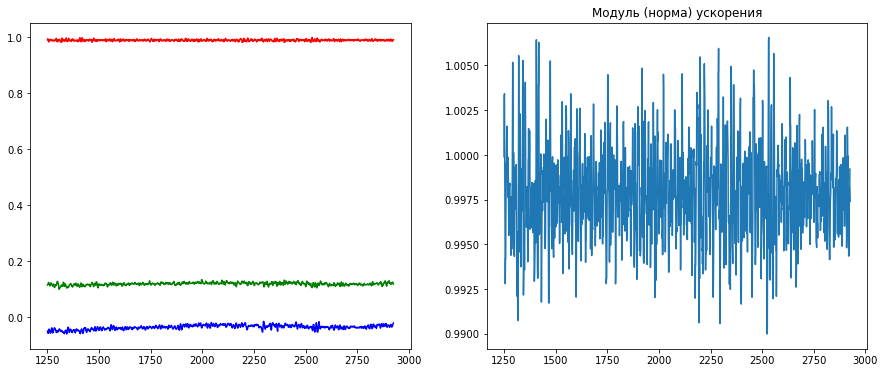

 АМПЛИТУДА: 0.016567989331872535

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_37.csv


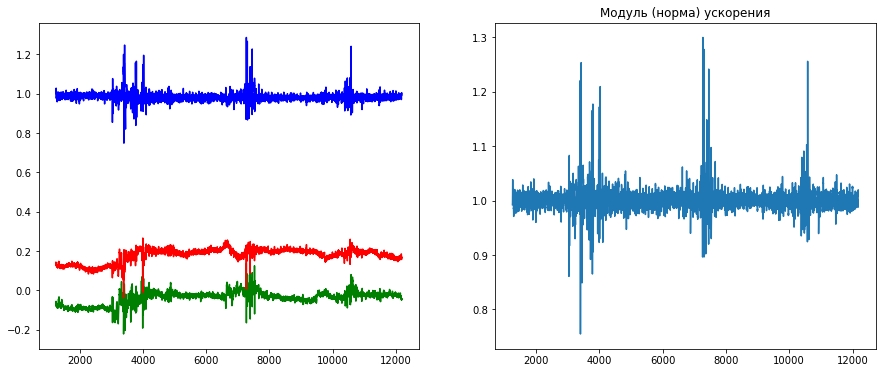

 АМПЛИТУДА: 0.5447078249883448

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_38.csv


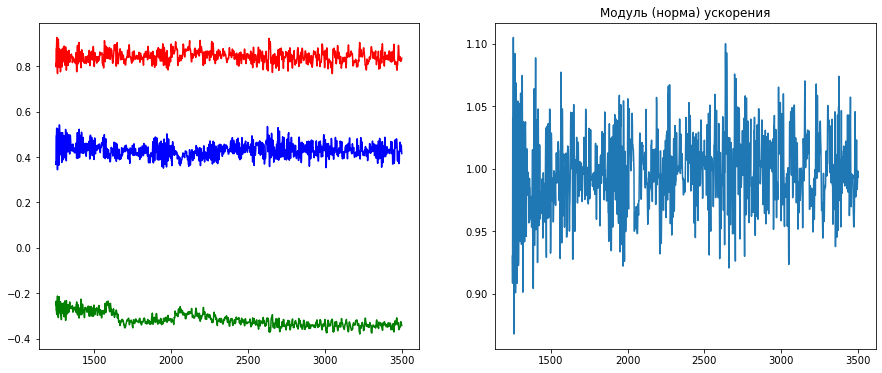

 АМПЛИТУДА: 0.23734383025525752

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_39.csv


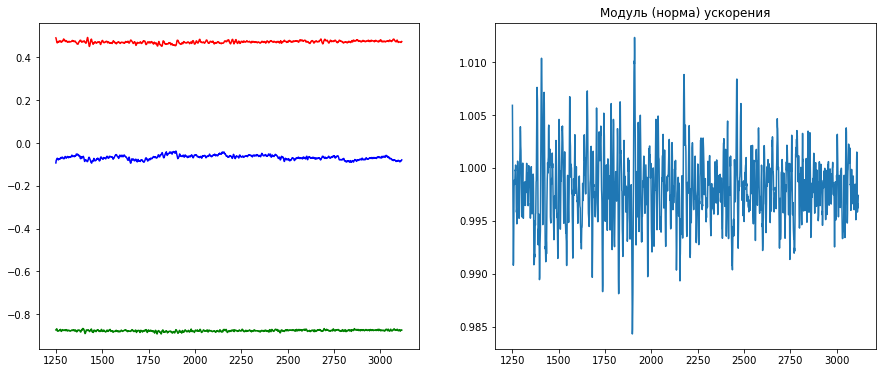

 АМПЛИТУДА: 0.028022233612311265

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_4.csv


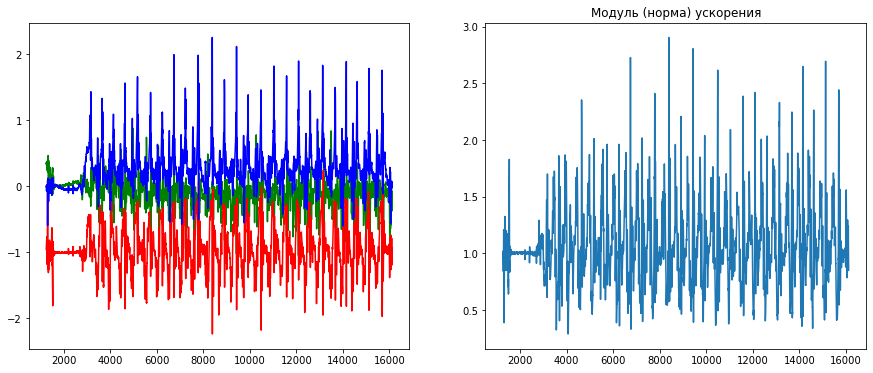

 АМПЛИТУДА: 2.6161380237808616

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_40.csv


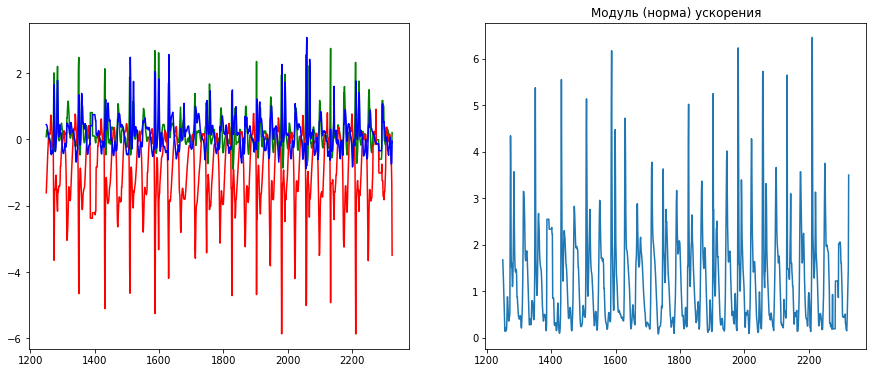

 АМПЛИТУДА: 6.373970126289841

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_41.csv


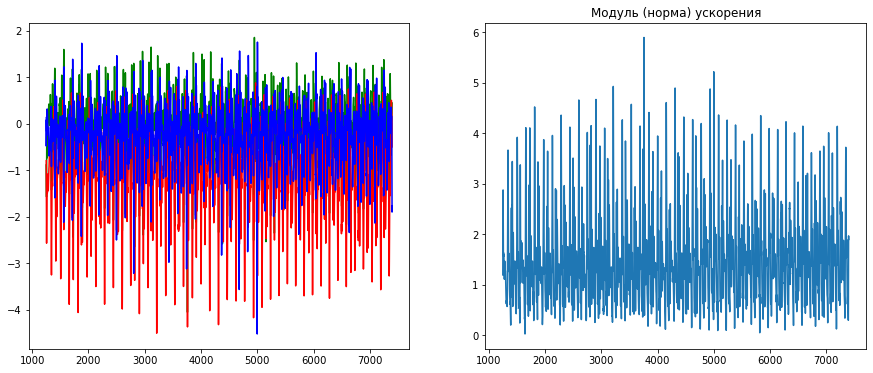

 АМПЛИТУДА: 5.872802467644566

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_42.csv


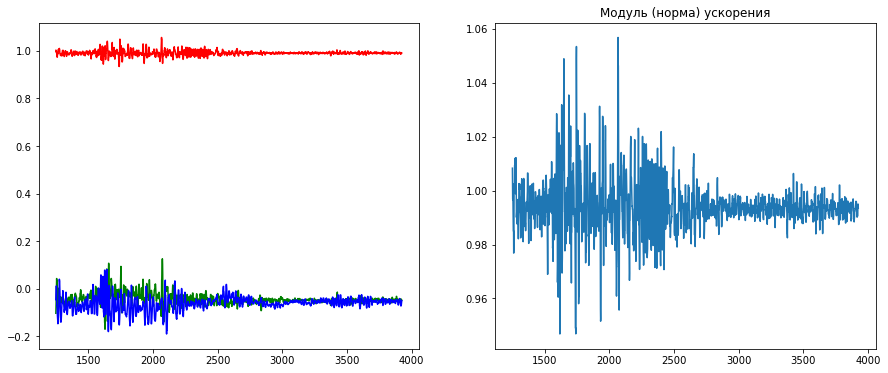

 АМПЛИТУДА: 0.11001130326326503

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_43.csv


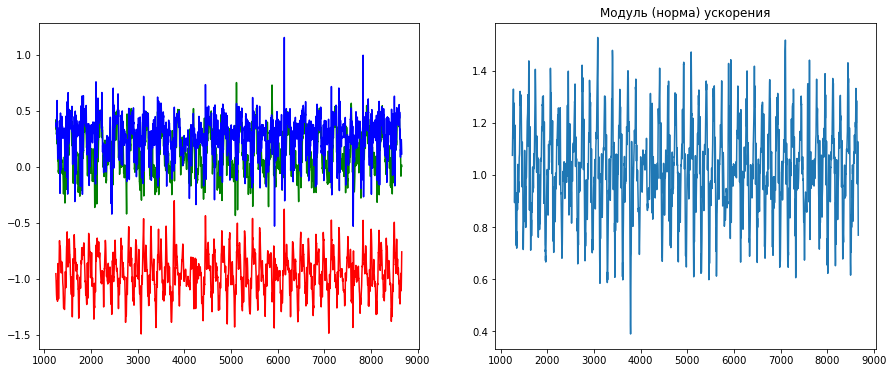

 АМПЛИТУДА: 1.1369080200726793

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_44.csv


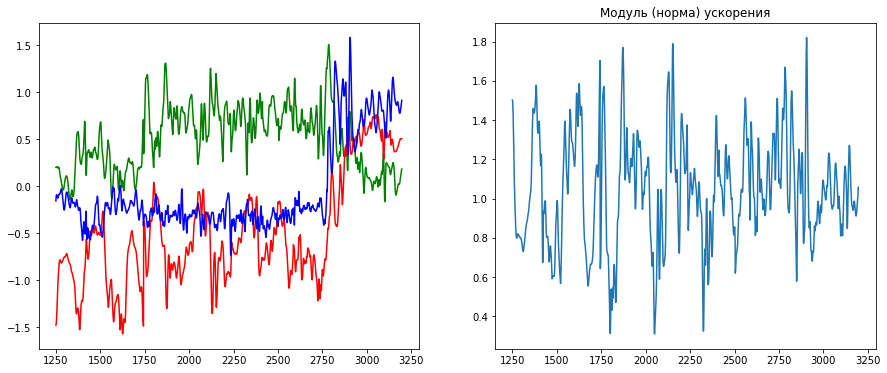

 АМПЛИТУДА: 1.5117563691489093

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_45.csv


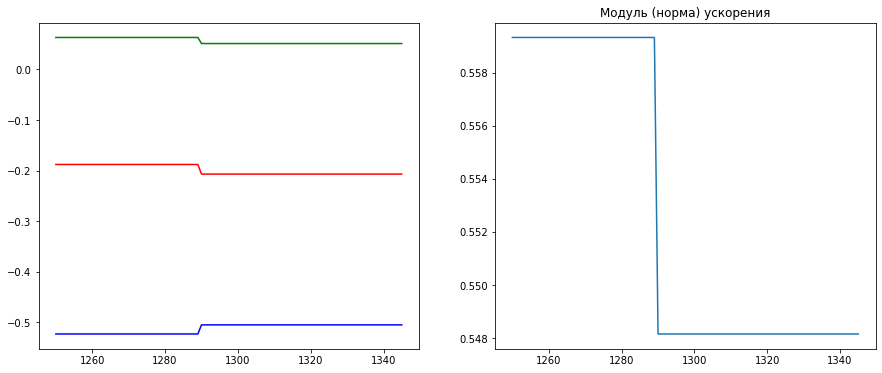

 АМПЛИТУДА: 0.011166805133891233

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_46.csv


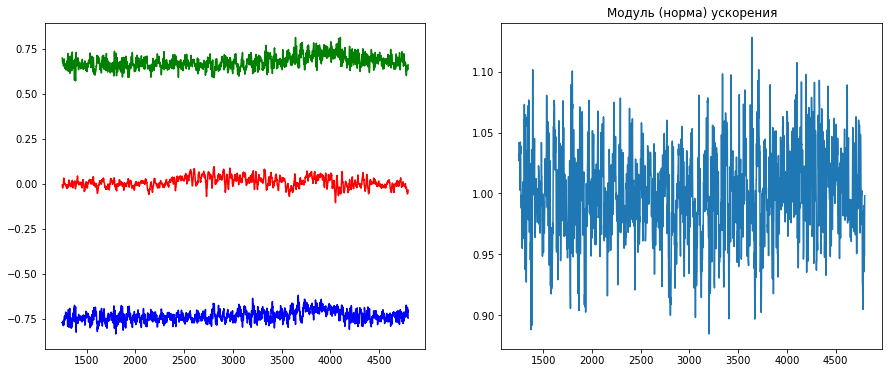

 АМПЛИТУДА: 0.24352048452468167

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_47.csv


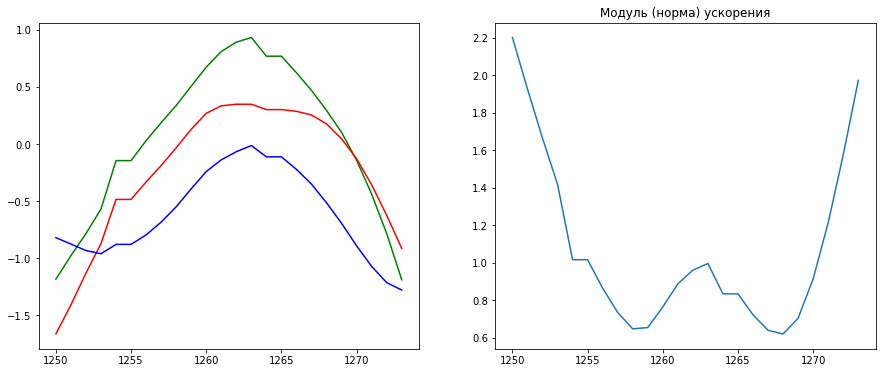

 АМПЛИТУДА: 1.5829736314222569

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_48.csv


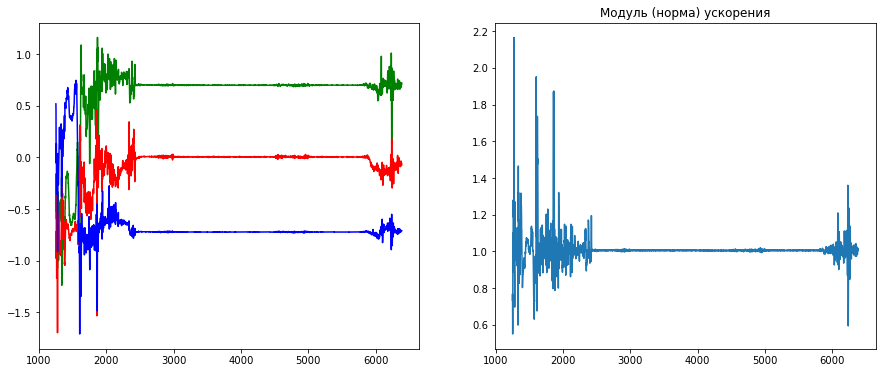

 АМПЛИТУДА: 1.615819278458014

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_49.csv


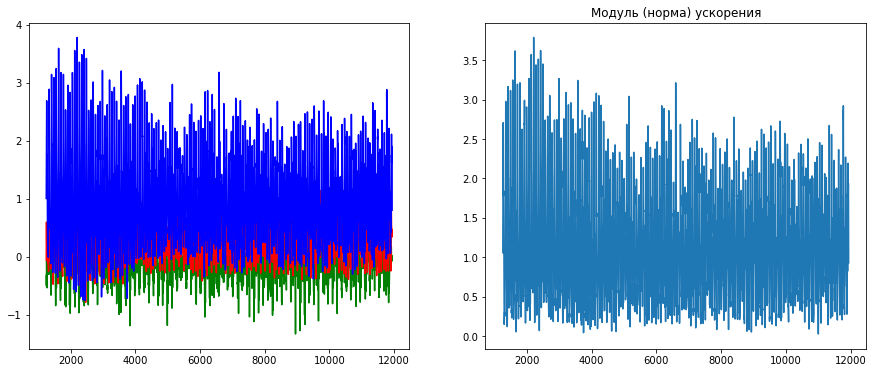

 АМПЛИТУДА: 3.7617486935148166

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_5.csv


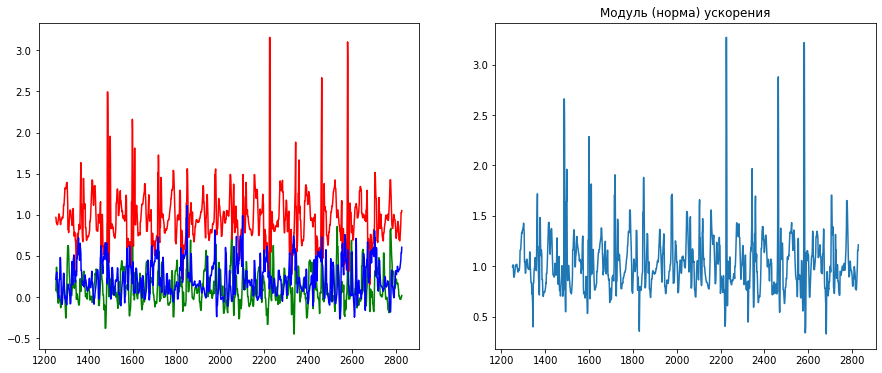

 АМПЛИТУДА: 2.9399536075474773

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_50.csv


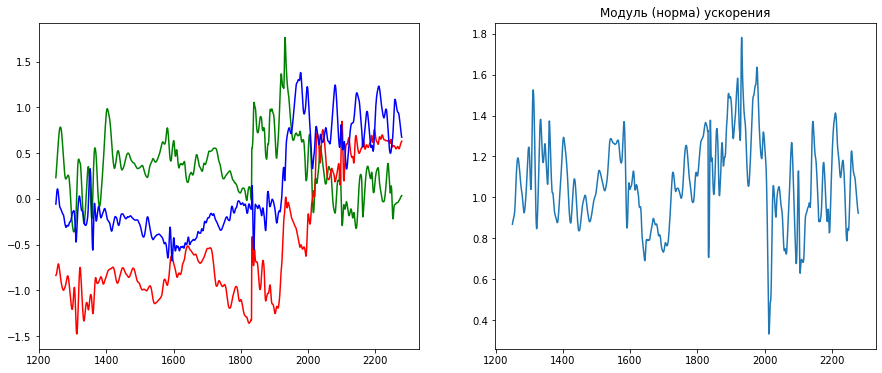

 АМПЛИТУДА: 1.4499291676896982

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_51.csv


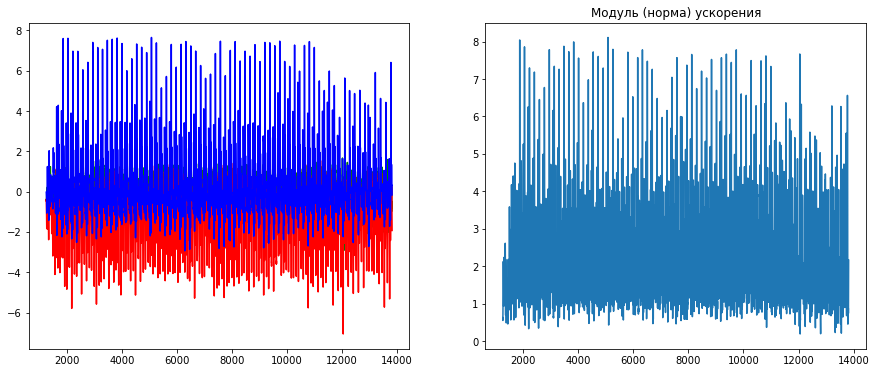

 АМПЛИТУДА: 7.918585692114179

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_52.csv


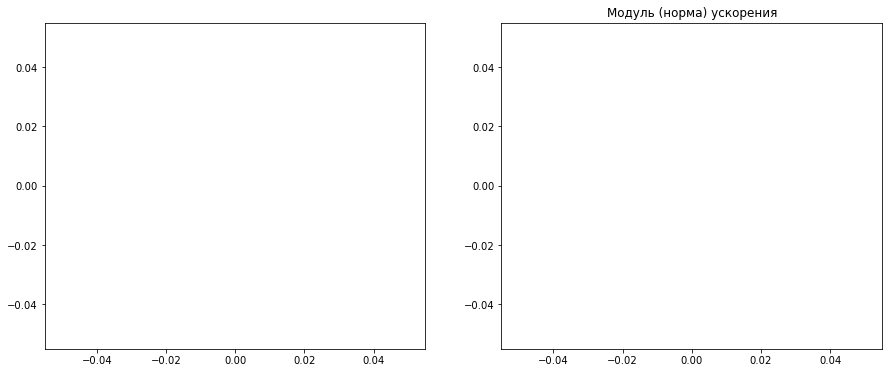

 АМПЛИТУДА: nan

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_53.csv


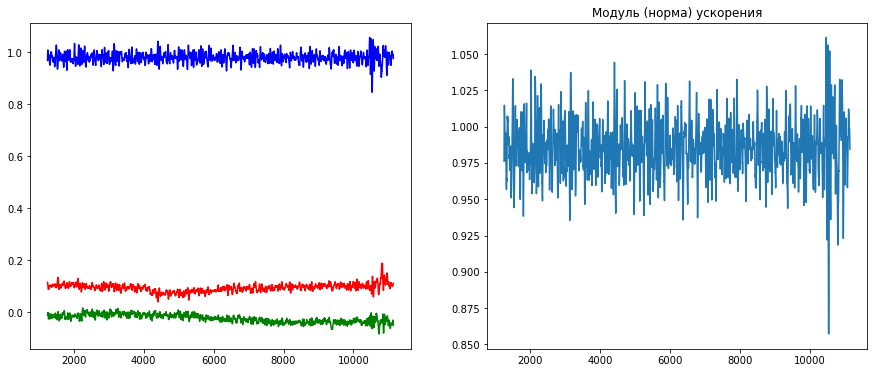

 АМПЛИТУДА: 0.2042013068877475

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_54.csv


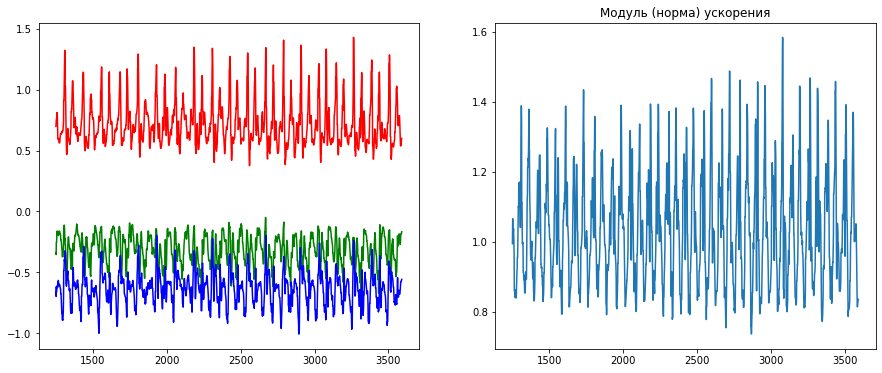

 АМПЛИТУДА: 0.8474686147631476

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_55.csv


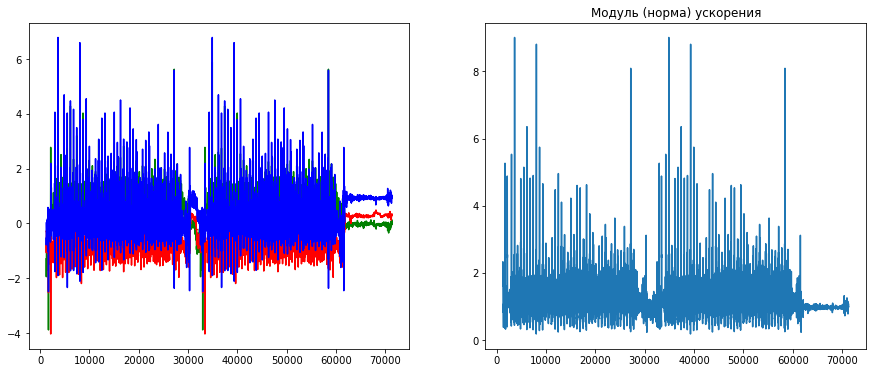

 АМПЛИТУДА: 8.830140717365285

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_56.csv


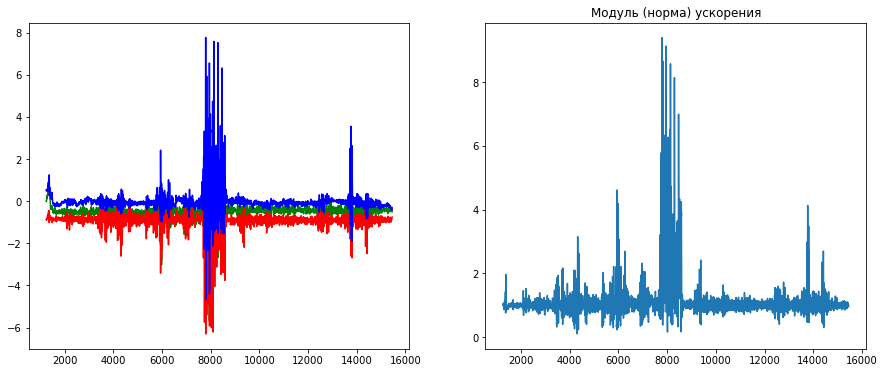

 АМПЛИТУДА: 9.293501190500901

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_57.csv


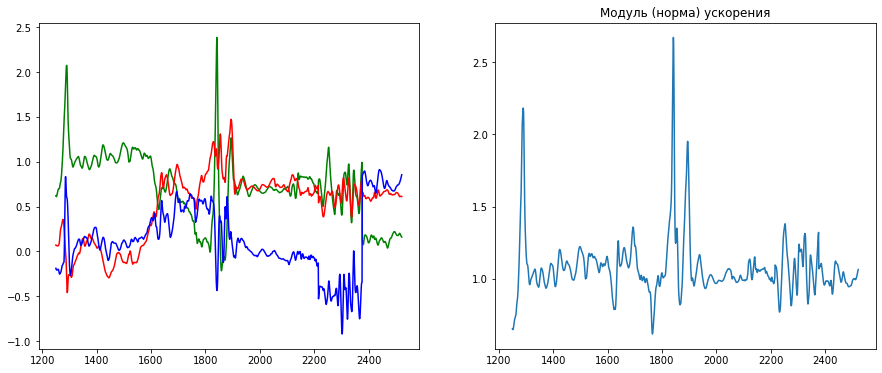

 АМПЛИТУДА: 2.0522956446526943

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_58.csv


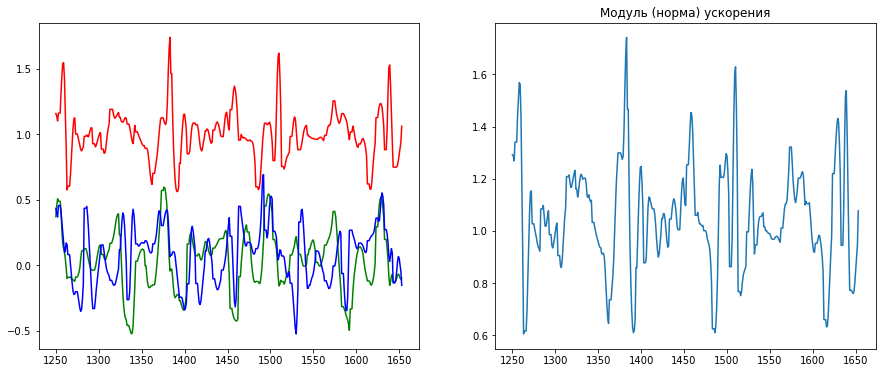

 АМПЛИТУДА: 1.137001353634465

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_59.csv


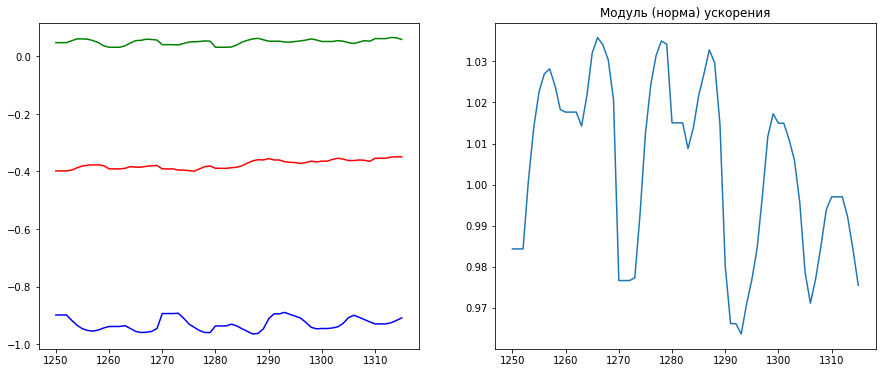

 АМПЛИТУДА: 0.07222220171183191

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_6.csv


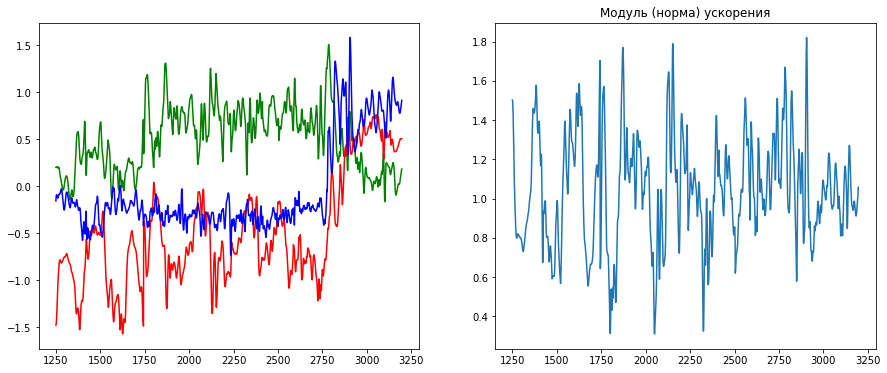

 АМПЛИТУДА: 1.5117563691489093

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_60.csv


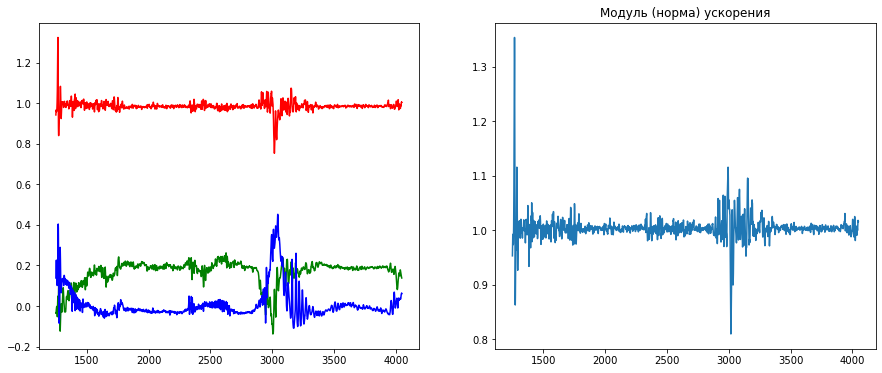

 АМПЛИТУДА: 0.5443440449710197

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_61.csv


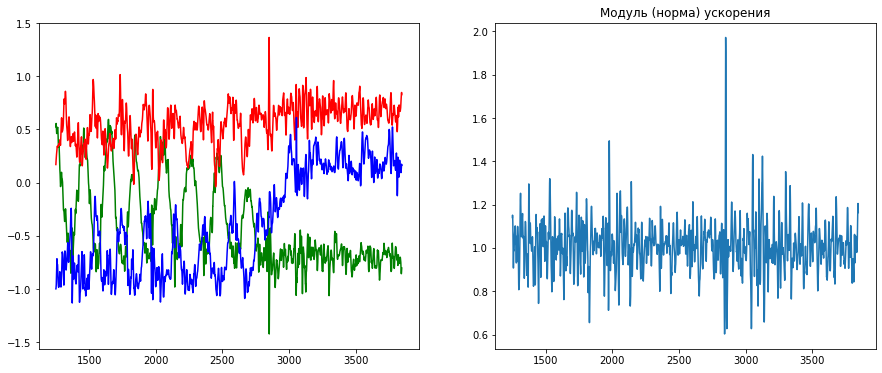

 АМПЛИТУДА: 1.3694113030743247

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_62.csv


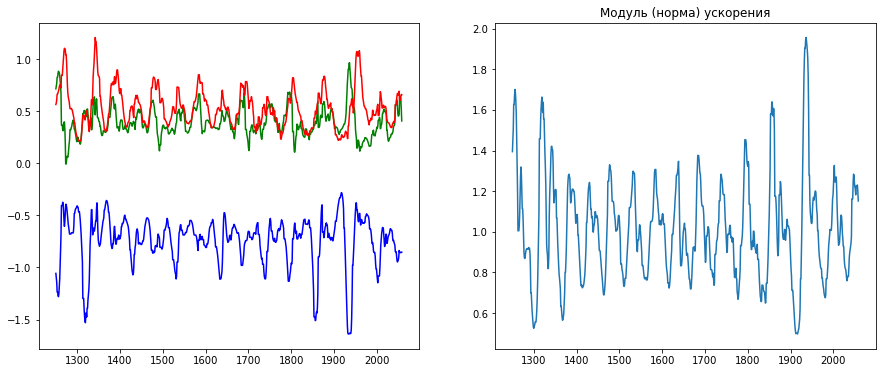

 АМПЛИТУДА: 1.4590536437339763

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_63.csv


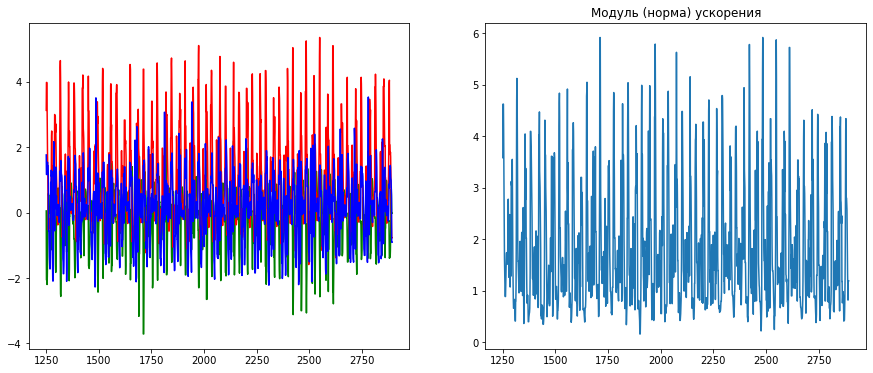

 АМПЛИТУДА: 5.762381882202736

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_64.csv


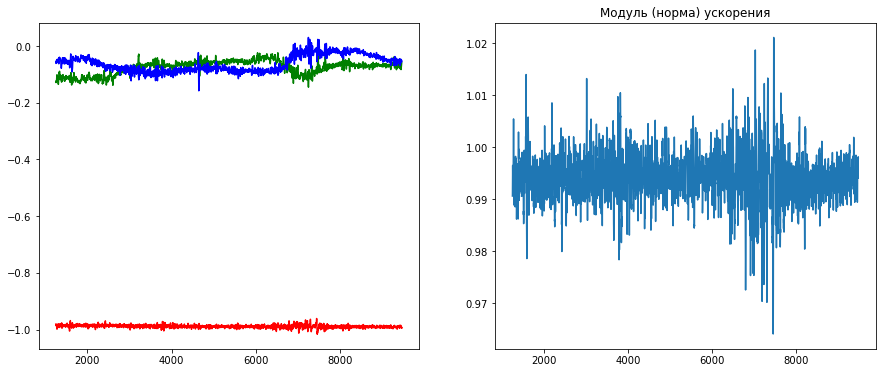

 АМПЛИТУДА: 0.05703627947763146

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_65.csv


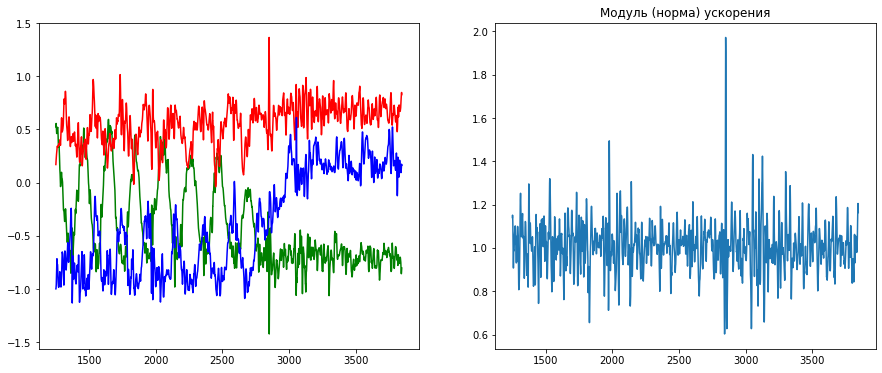

 АМПЛИТУДА: 1.3694113030743247

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_66.csv


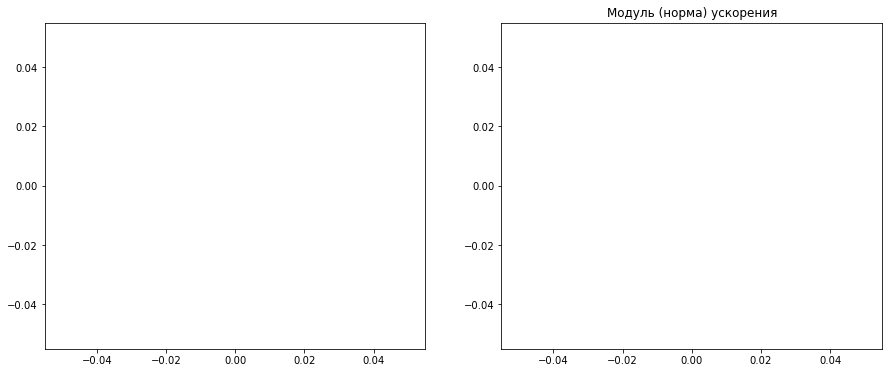

 АМПЛИТУДА: nan

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_67.csv


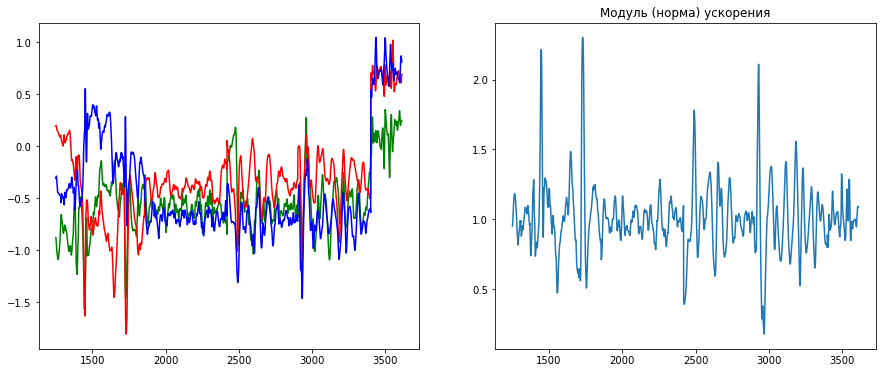

 АМПЛИТУДА: 2.124336238883378

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_68.csv


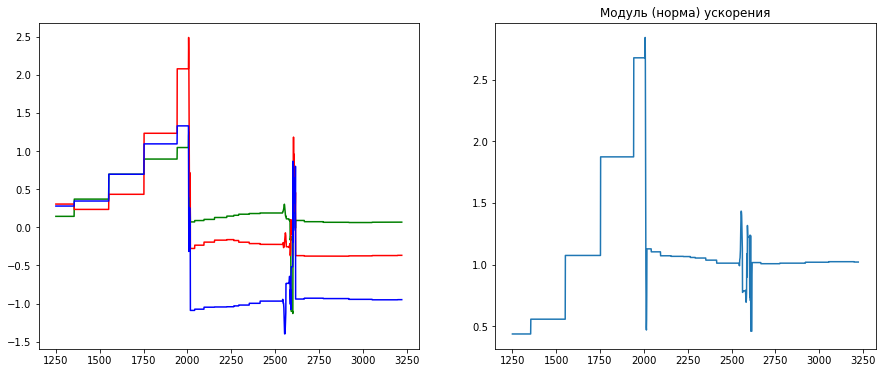

 АМПЛИТУДА: 2.407250674120206

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_69.csv


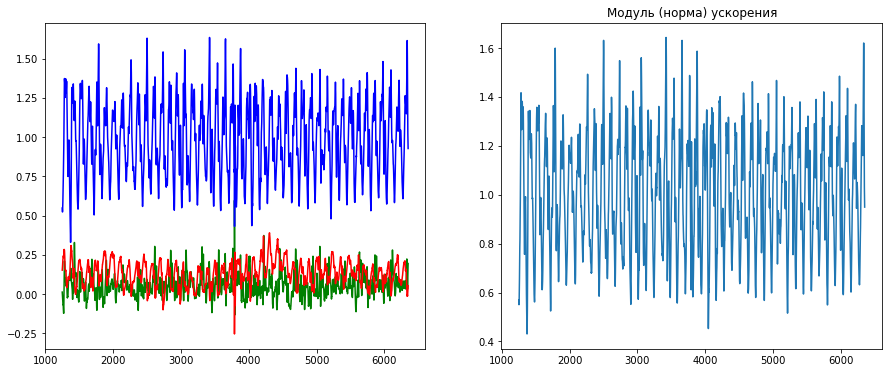

 АМПЛИТУДА: 1.212572525596172

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_7.csv


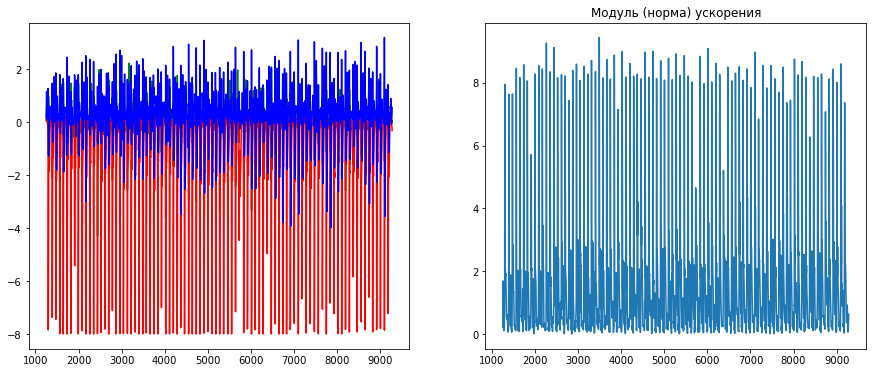

 АМПЛИТУДА: 9.43369600102802

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_70.csv


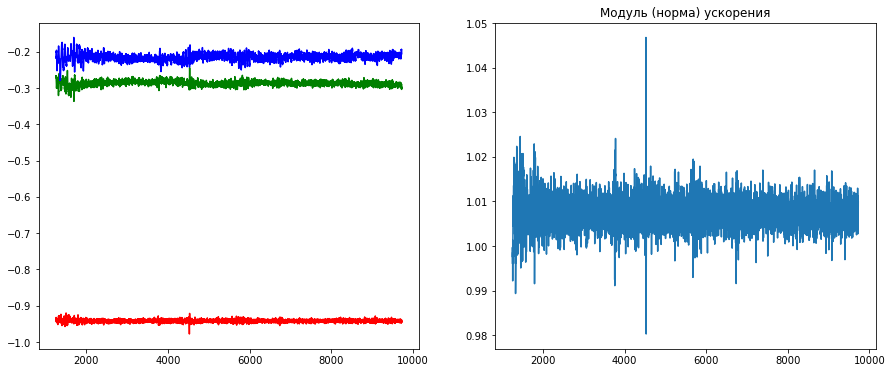

 АМПЛИТУДА: 0.06644780954833251

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_71.csv


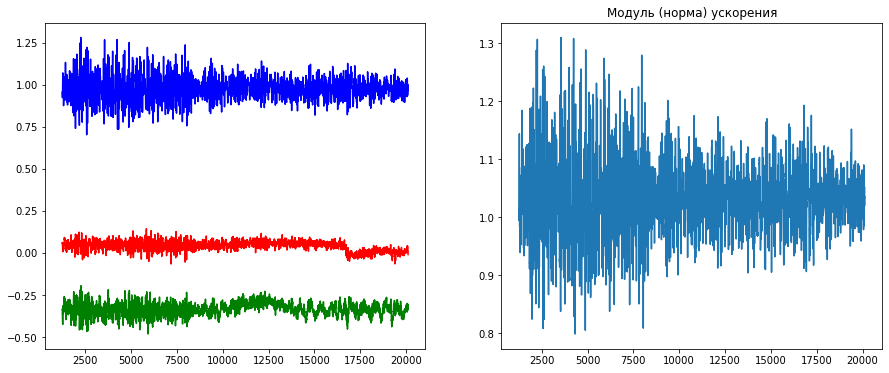

 АМПЛИТУДА: 0.5116359327501921

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_72.csv


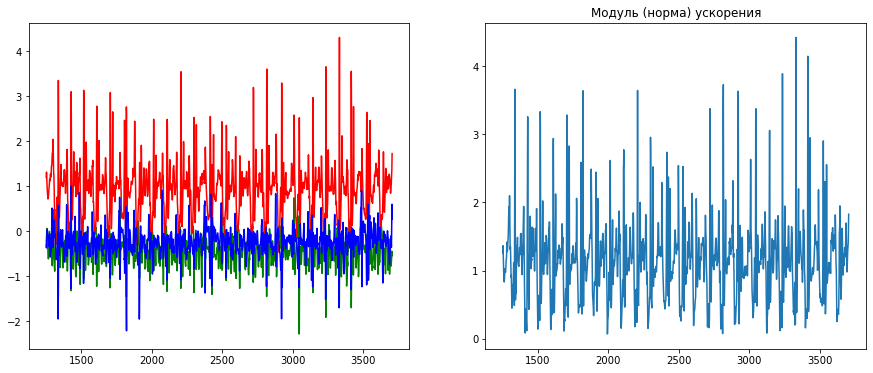

 АМПЛИТУДА: 4.351635719111044

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_73.csv


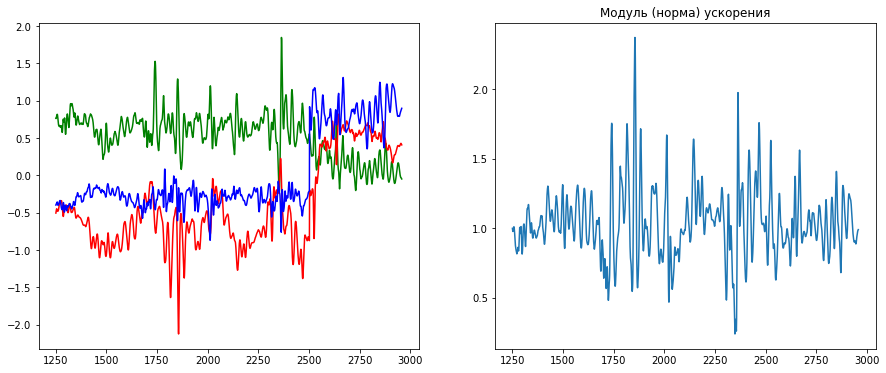

 АМПЛИТУДА: 2.1336461804594

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_74.csv


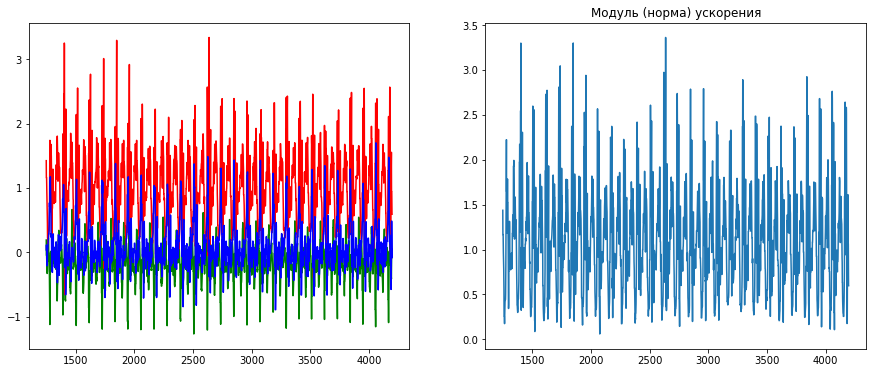

 АМПЛИТУДА: 3.301098397972242

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_75.csv


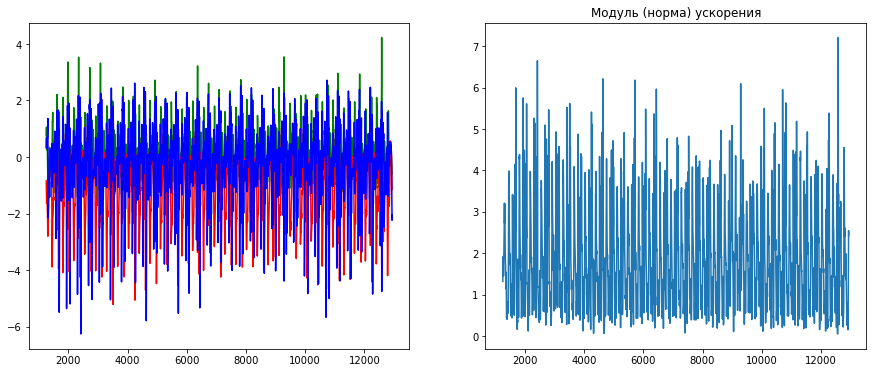

 АМПЛИТУДА: 7.158302893444175

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_76.csv


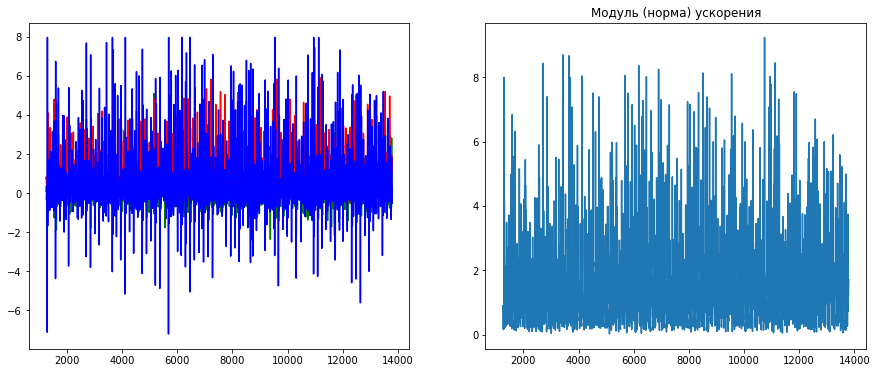

 АМПЛИТУДА: 9.216037535513616

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_77.csv


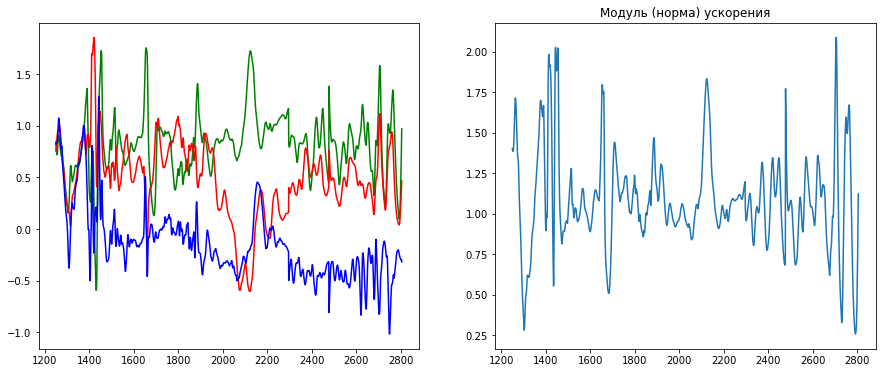

 АМПЛИТУДА: 1.8330376632404348

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_78.csv


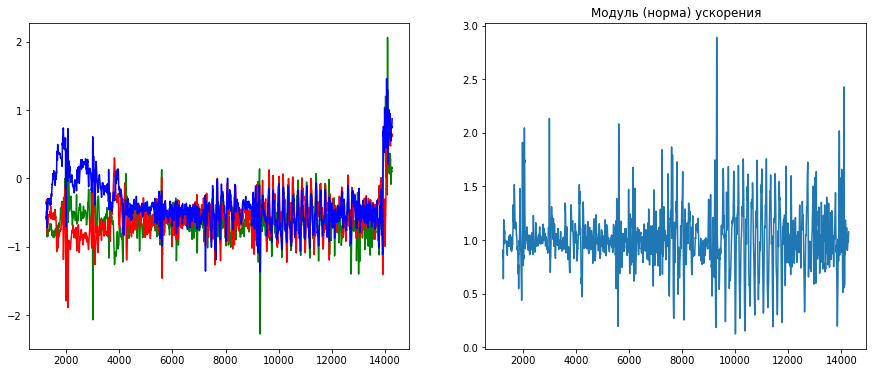

 АМПЛИТУДА: 2.76747032033991

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_79.csv


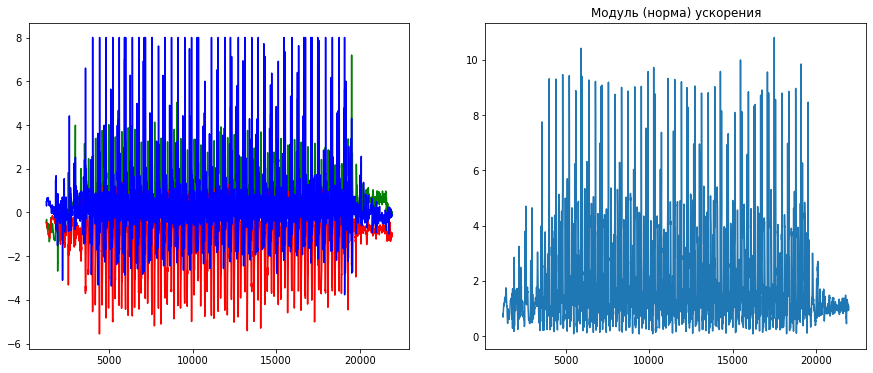

 АМПЛИТУДА: 10.731937096693194

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_8.csv


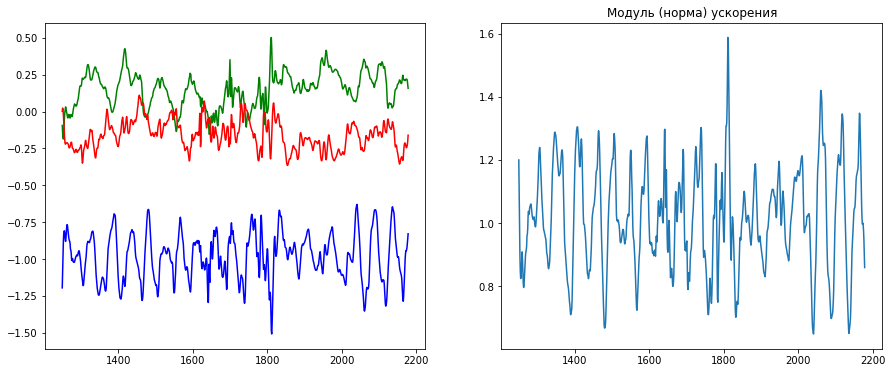

 АМПЛИТУДА: 0.9393878301836878

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_80.csv


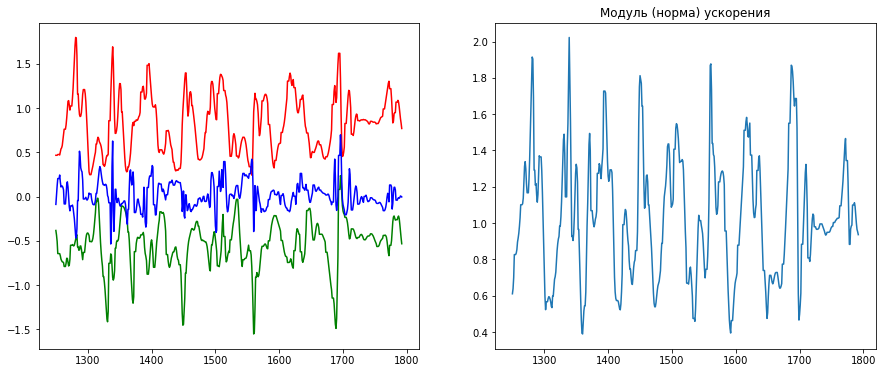

 АМПЛИТУДА: 1.633777351071156

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_81.csv


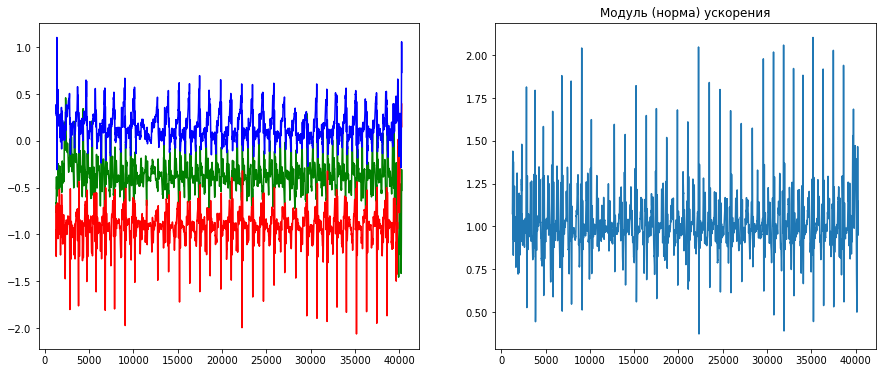

 АМПЛИТУДА: 1.7316058352812163

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_82.csv


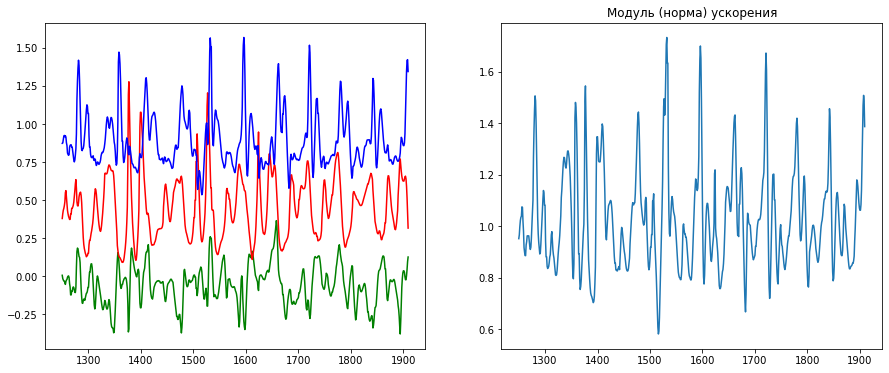

 АМПЛИТУДА: 1.1505238336426609

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_83.csv


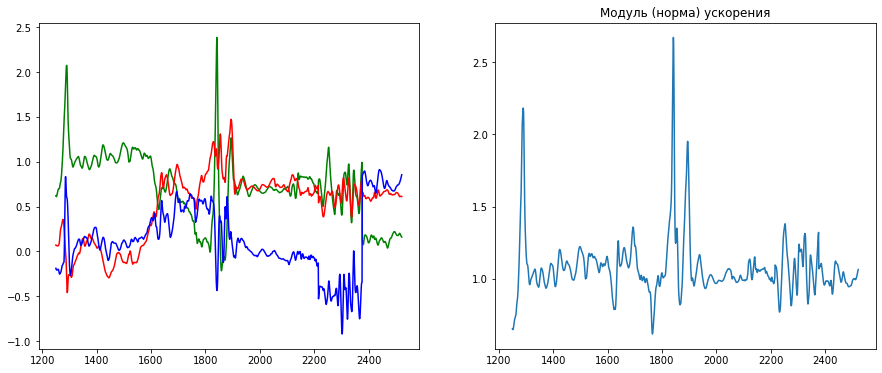

 АМПЛИТУДА: 2.0522956446526943

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_84.csv


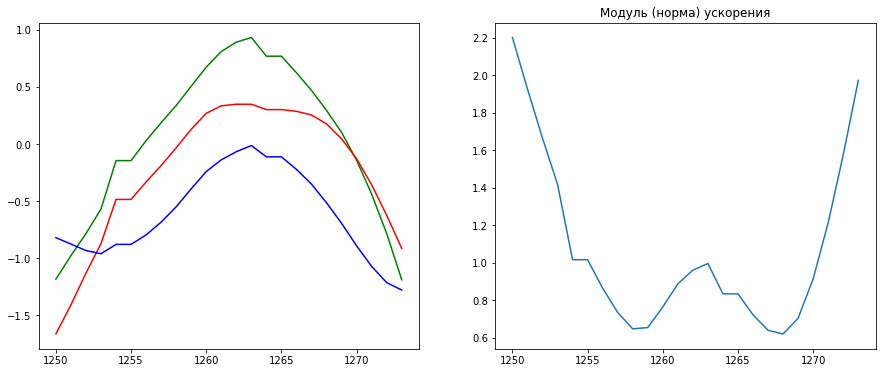

 АМПЛИТУДА: 1.5829736314222569

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_85.csv


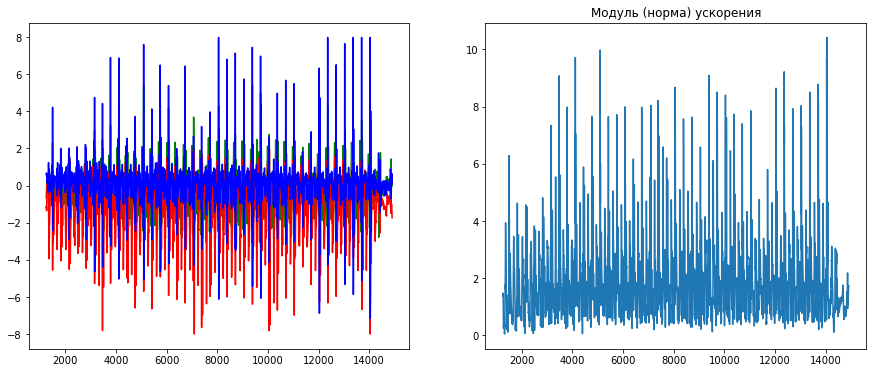

 АМПЛИТУДА: 10.366406365305139

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_86.csv


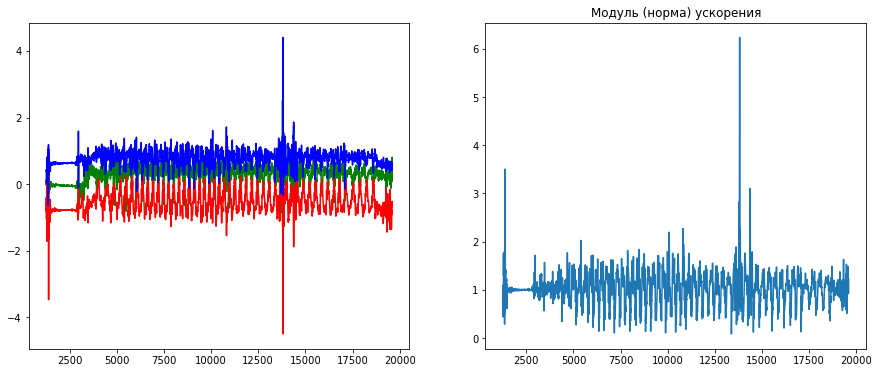

 АМПЛИТУДА: 6.151439856806816

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_87.csv


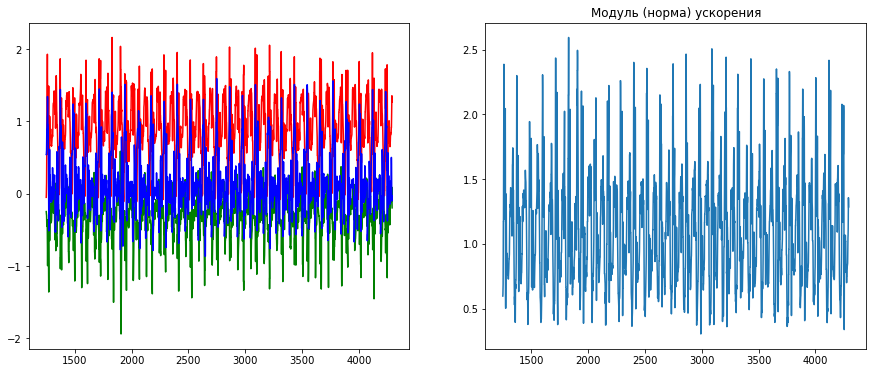

 АМПЛИТУДА: 2.288305098772688

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_88.csv


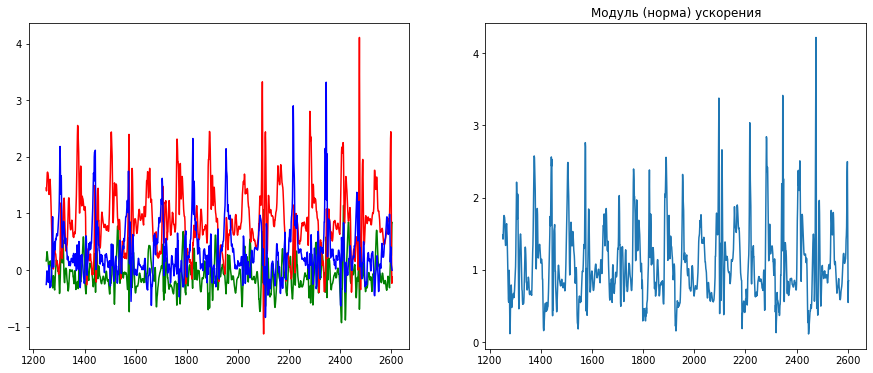

 АМПЛИТУДА: 4.1033722548679314

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_89.csv


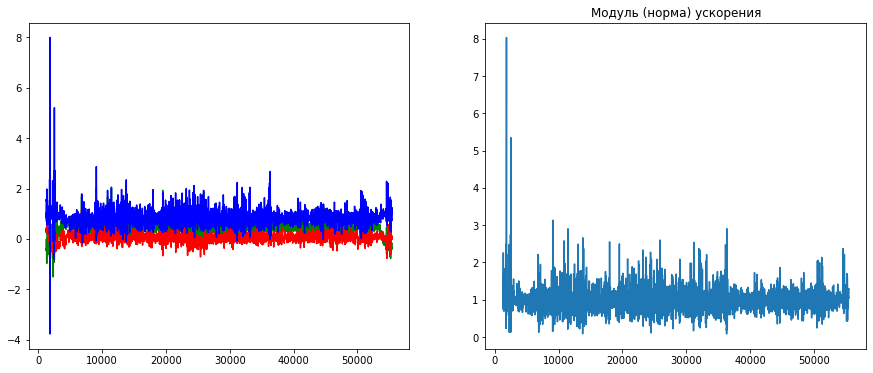

 АМПЛИТУДА: 7.956676829256679

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_9.csv


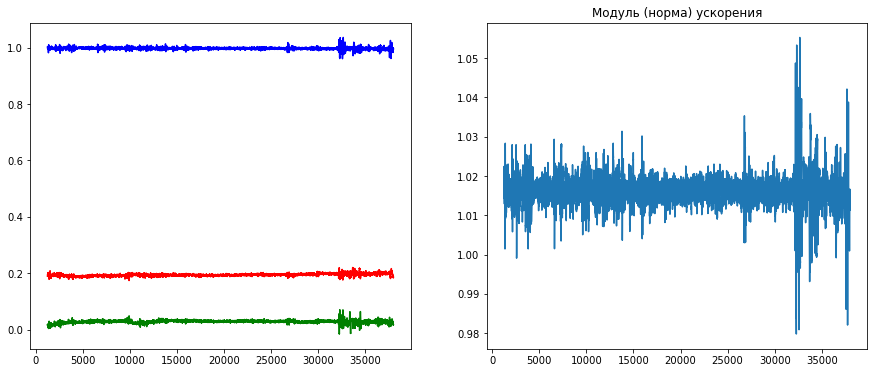

 АМПЛИТУДА: 0.0754719928206189

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_90.csv


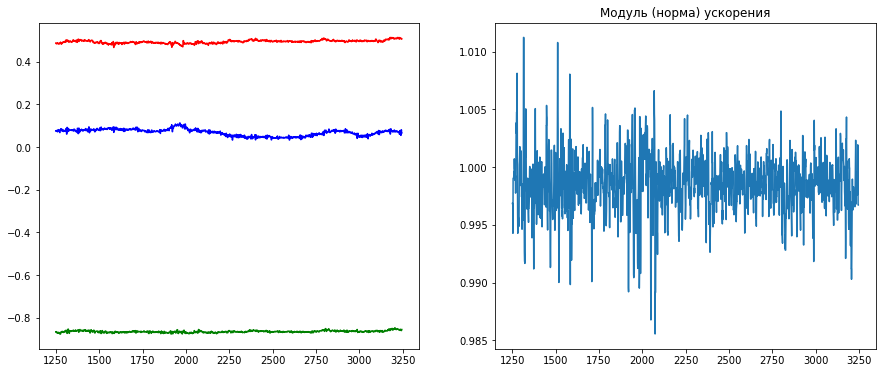

 АМПЛИТУДА: 0.025694414883784766

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_91.csv


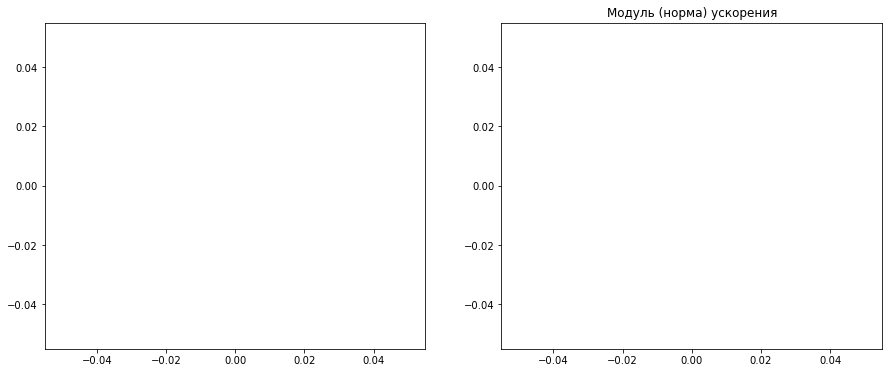

 АМПЛИТУДА: nan

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_92.csv


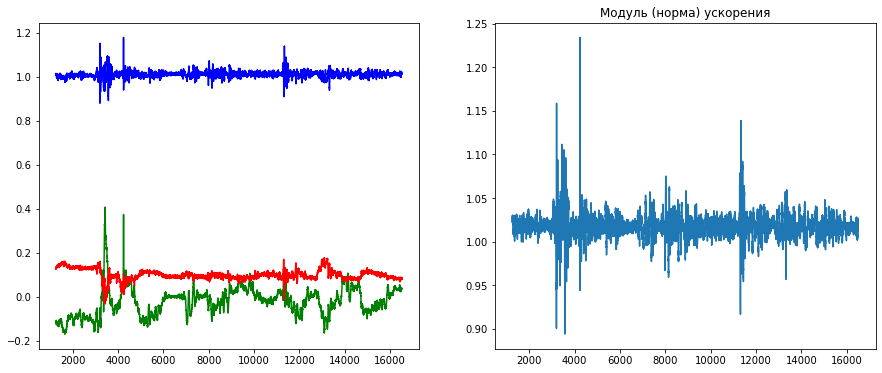

 АМПЛИТУДА: 0.3402407681738169

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_93.csv


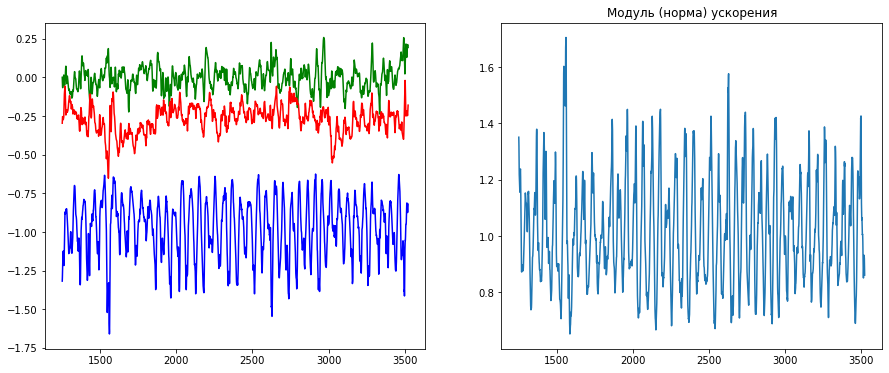

 АМПЛИТУДА: 1.0520805860431857

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_94.csv


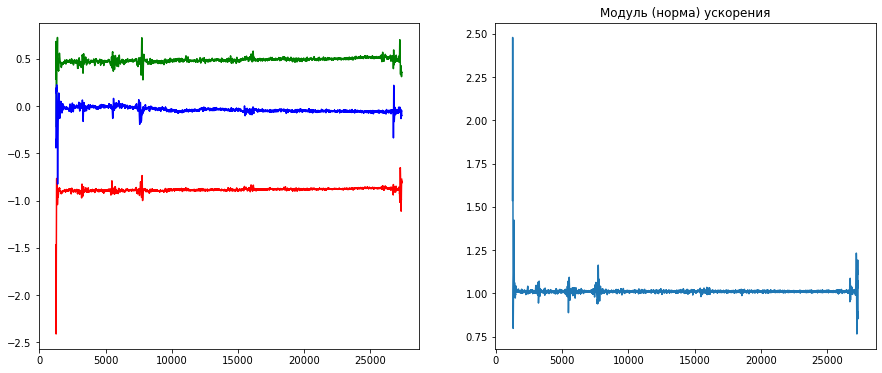

 АМПЛИТУДА: 1.7141168789189019

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_95.csv


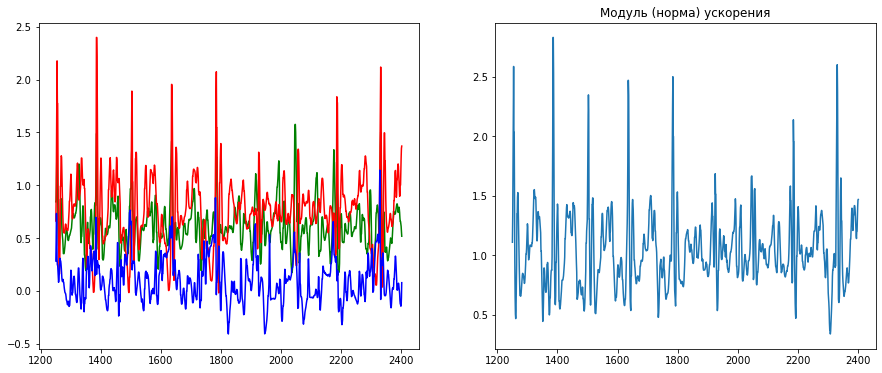

 АМПЛИТУДА: 2.490927518631091

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_96.csv


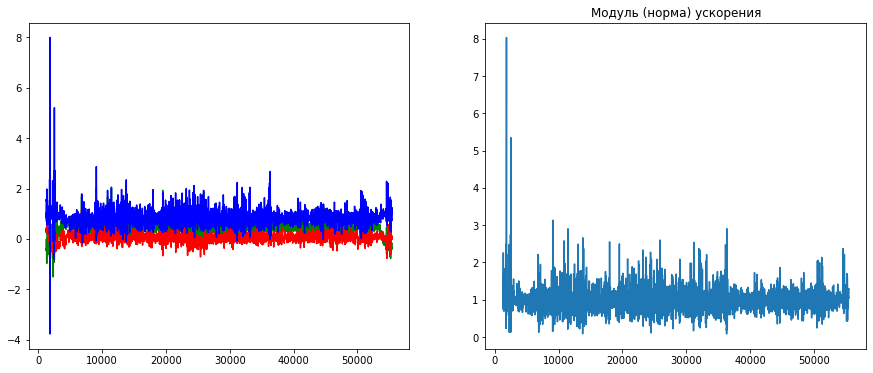

 АМПЛИТУДА: 7.956676829256679

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_97.csv


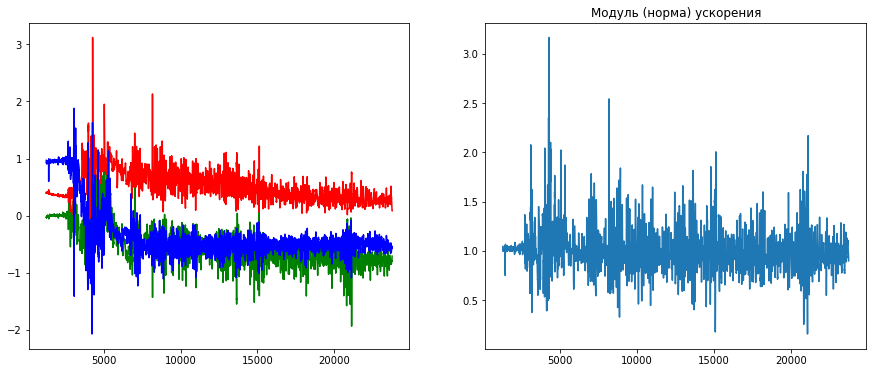

 АМПЛИТУДА: 3.0087221132495734

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_98.csv


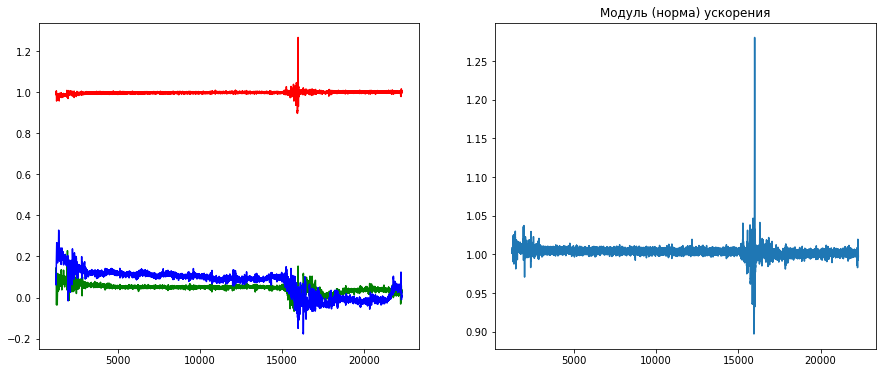

 АМПЛИТУДА: 0.3832853345388927

/Users/ninachel/Downloads/Activities-analysis-main/kaggle_tracks_new/track_99.csv


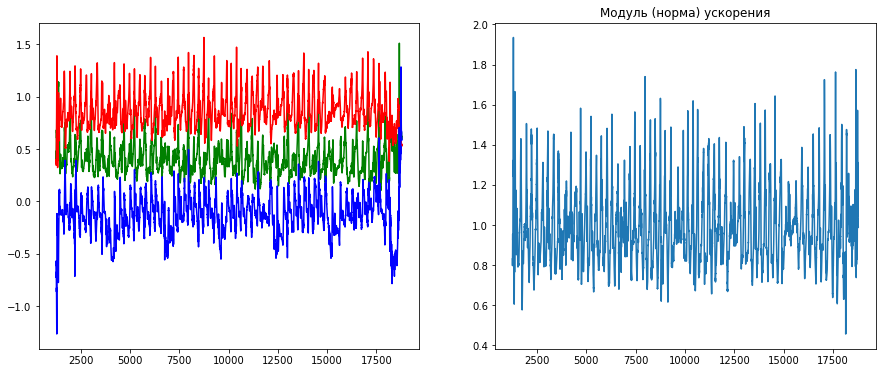

 АМПЛИТУДА: 1.4788910252921896



In [5]:
import pandas as pd
from matplotlib import pylab as plt
%pylab inline

def process_data(df, comma=True, cut=True, name = "", a=-1, b=-1):
    
# обрезаем начало и конец трека
    if a == -1:
        st = 1250
    else:
        st = a
            
    if b == -1:
        end = -1250
    else:
        end = b
        
    if cut == False:
        st = 0
        end = -1

    print(name)
    fig, ((ax1, ax2)) = plt.subplots(nrows=1, ncols=2, figsize=(15,6))
    plt.title("Графики ускорений")

# приводим данные с Iphone к нужному формату
    if comma is True:
        df = df.applymap(lambda x: str(x).replace(',','.'))
        
        try:
            df['gFx'] = df['gFx'].astype(float)
            df['gFy'] = df['gFy'].astype(float)
            df['gFz'] = df['gFz'].astype(float)
        except KeyError:
            return -1

# рисуем графики ускорений
    if cut:
        ax1.plot(df.iloc[st:end]['gFx'],c='g')
        ax1.plot(df.iloc[st:end]['gFy'],c='r')
        ax1.plot(df.iloc[st:end]['gFz'],c='b')
    else:
        ax1.plot(df['gFx'],c='g')
        ax1.plot(df['gFy'],c='r')
        ax1.plot(df['gFz'],c='b')
        
# вычисляем модуль (норму) ускорения и рисуем его
    Acc = (df.gFx[st:end] ** 2 + df.gFy[st:end] ** 2 + df.gFz[st:end] ** 2) ** 0.5
    ax2.plot(Acc)
    plt.title("Модуль (норма) ускорения")
    plt.show()

# можно различить многие действия по амплитуде ускорения
    amplitude = Acc.max() - Acc.min()
    print(' АМПЛИТУДА:', Acc.max()-Acc.min())
    print()
    
    return amplitude

Ampl = []
for df, target in zip(Data,Target):
    Ampl.append(process_data(df, name=target))

Напишем функцию для получения предсказания (здесь используется только амплитуда, но в вашем итоговом решении будет больше признаков)

In [ ]:
def get_prediction(ampl):
    if ampl < 1:
        return 0 #стояние
    if ampl >  5:
        return 2 #бег
    return 1 #ходьба

In [ ]:
len(Data), len(Ampl), len(Target)

Некоторые амплитуды посчитаны некорректно, уберём соответствующие треки.

In [ ]:
good_indices = [i for i in range(len(Ampl)) if not (math.isnan(Ampl[i]) or Ampl[i]==1)]

GoodData   = [Data[i] for i in good_indices]
GoodAmpl   = [Ampl[i] for i in good_indices]
GoodTarget = [Target[i] for i in good_indices]

In [ ]:
len(Data), len(GoodData)

Создадим таблицу, содержащую номер трека, правильный ответ и предсказание.

In [ ]:
prediction = [get_prediction(a) for a in GoodAmpl]
answer = [get_action(target) for target in GoodTarget]

Res = pd.DataFrame({'track_num' : np.arange(len(GoodData)), 'answer' : answer, 'action' : prediction})
Res.head(10)

Проверим качество нашей модели на тренировочных данных (на данных из открытой папки)

In [ ]:
from sklearn.metrics import accuracy_score

accuracy_score(Res['answer'], Res['action'])

В тренировочной папке количество треков разных типов несбалансировано, поэтому для корректной оценки качества нашей модели будем проверять качество модели на таком же распределении треков, как и в тестовой выборке:

* 18% - стояние
* 18 % - ходьба
* 18 % - бег
* 18 % - подъем по лестнице
* 18 % - велосипед
* 10% - другие типы движений

In [ ]:
Res['answer'].value_counts(), len(Res)

In [ ]:
import random

ind_0 = random.sample(Res[Res.answer == 0].index.tolist(), 32)
ind_1 = random.sample(Res[Res.answer == 1].index.tolist(), 32)
ind_2 = random.sample(Res[Res.answer == 2].index.tolist(), 32)
ind_3 = random.sample(Res[Res.answer == 3].index.tolist(), 32)
ind_4 = random.sample(Res[Res.answer == 4].index.tolist(), 32)
ind_5 = random.sample(Res[Res.answer == 5].index.tolist(), 2)
ind_6 = random.sample(Res[Res.answer == 6].index.tolist(), 2)
ind_7 = random.sample(Res[Res.answer == 7].index.tolist(), 2)

ind_balanced = ind_0 + ind_1 + ind_2 + ind_3 + ind_4 + ind_5 + ind_6 + ind_7 
len(ind_balanced)

In [ ]:
Res_balanced = Res.iloc[ind_balanced]

In [ ]:
accuracy_score(Res_balanced['answer'], Res_balanced['action'])